# <p style="background-color:  #C0C0C0; font-family:newtimeroman;font-size:200%;color: blue;text-align:center;border-radius:90px 20px;"><b>  Modelling Auto Scout Project  <img src="forbidden.png" style="width: 70x;" alt="Small Truck Icon" style="position: absolute; right: 5px; top: 60%; transform: translateY(-70%);"> </div> 

Welcome to "***Car Price Prediction Project***". This is the first medium project of ***Machine Learning*** course. In this project you will have the opportunity to apply many algorithms commonly used for regression problems.

Also, you will apply various processes such as pre-processing, ***train-test spilit*** and ***cross validation*** that you will use in algorithm modeling and prediction processes in Python with ***scikit-learn***. 

Before diving into the project, please take a look at the determines and tasks.

- **NOTE:** This project assumes that you already know the basics of coding in Python. You should also be familiar with the theory behind regression algorithms and scikit-learn module as well as Machine Learning before you begin.

# #Determines

**Auto Scout** data which using for this project, scraped from the on-line car trading company(https://www.autoscout24.com) in 2019, contains many features of 9 different car models. In this project, you will use the data set which is already preprocessed and prepared for algorithms .

The aim of this project to understand of machine learning algorithms. Therefore, you will not need any EDA process as you will be working on the edited data.

---

In this Senario, you will estimate the prices of cars using regression algorithms.

While starting you should import the necessary modules and load the data given as pkl file. Also you'll need to do a few pre-processing before moving to modelling. After that you will implement ***Linear Regression, Ridge Regression, Lasso Regression,and Elastic-Net algorithms respectively*** (After completion of Unsupervised Learning section, you can also add bagging and boosting algorithms such as ***Random Forest and XG Boost*** this notebook to develop the project. You can measure the success of your models with regression evaluation metrics as well as with cross validation method.

For the better results, you should try to increase the success of your models by performing hyperparameter tuning. Determine feature importances for the model. You can set your model with the most important features for resource saving. You should try to apply this especially in Random Forest and XG Boost algorithms. Unlike the others, you will perform hyperparameter tuning for Random Forest and XG Boost using the ***GridSearchCV*** method. 

Finally You can compare the performances of algorithms, work more on the algorithm have the most successful prediction rate.


# #Tasks

#### 1. Import Modules, Load Data and Data Review
#### 2. Data Pre-Processing
#### 3. Implement Linear Regression 
#### 4. Implement Ridge Regression
#### 5. Implement Lasso Regression 
#### 6. Implement Elastic-Net
#### 7. Visually Compare Models Performance In a Graph

<p style="background-color: #C0C0C0; font-family: newtimeroman; font-size: 250%; color: blue; border-radius: 80px 20px; padding: 25px; text-align: center;"> <b>Data Preparation-EDA and Data Cleaning</b>
<img src="forbidden.png" style="width: 150px; vertical-align: left; margin-left: 20px; float:right;" alt="Small Truck Icon">
 <span style="display: inline-block; width: calc(80% - 20px); text-align: center;"></span> 
</p>



## 1. Import Modules, Load Data and Data Review

In [ ]:
#!pip install pandas
#!pip install numpy

#!pip install matplotlib
#!pip install seaborn
#!pip install scikit-learn 
#!pip install sklearn
#pip install plotly


#!pip install missingno 
#!pip install summarytools
#!pip install ydata-profiling

# pip install inflection
# pip install skimpy

## <font color='blue'> <b>Import Library</b><font color='black'>

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
 
#%matplotlib inline  

import warnings
warnings.filterwarnings('ignore')
plt.rcParams["figure.figsize"] = (10,6)
pd.set_option('display.max_columns', 100)

import scipy.stats as stats
import inflection
from skimpy import clean_columns
import missingno as msno
import plotly.graph_objects as go
from scipy.stats import skew

## <font color='blue'> <b>Read Dataset</b><font color='black'>

In [806]:
auto = pd.read_csv("final_scout_not_dummy.csv")
df1 = auto.copy()
df1

,make_model,body_type,price,vat,km,Type,Fuel,Gears,Comfort_Convenience,Entertainment_Media,Extras,Safety_Security,age,Previous_Owners,hp_kW,Inspection_new,Paint_Type,Upholstery_type,Gearing_Type,Displacement_cc,Weight_kg,Drive_chain,cons_comb
0,Audi A1,Sedans,15770,VAT deductible,56013.000000,Used,Diesel,7.0,"Air conditioning,Armrest,Automatic climate con...","Bluetooth,Hands-free equipment,On-board comput...","Alloy wheels,Catalytic Converter,Voice Control","ABS,Central door lock,Daytime running lights,D...",3.0,2.0,66.0,1,Metallic,Cloth,Automatic,1422.0,1220.0,front,3.8
1,Audi A1,Sedans,14500,Price negotiable,80000.000000,Used,Benzine,7.0,"Air conditioning,Automatic climate control,Hil...","Bluetooth,Hands-free equipment,On-board comput...","Alloy wheels,Sport seats,Sport suspension,Voic...","ABS,Central door lock,Central door lock with r...",2.0,1.0,141.0,0,Metallic,Cloth,Automatic,1798.0,1255.0,front,5.6
2,Audi A1,Sedans,14640,VAT deductible,83450.000000,Used,Diesel,7.0,"Air conditioning,Cruise control,Electrical sid...","MP3,On-board computer","Alloy wheels,Voice Control","ABS,Central door lock,Daytime running lights,D...",3.0,1.0,85.0,0,Metallic,Cloth,Automatic,1598.0,1135.0,front,3.8
3,Audi A1,Sedans,14500,VAT deductible,73000.000000,Used,Diesel,6.0,"Air suspension,Armrest,Auxiliary heating,Elect...","Bluetooth,CD player,Hands-free equipment,MP3,O...","Alloy wheels,Sport seats,Voice Control","ABS,Alarm system,Central door lock with remote...",3.0,1.0,66.0,0,Metallic,Cloth,Automatic,1422.0,1195.0,front,3.8
4,Audi A1,Sedans,16790,VAT deductible,16200.000000,Used,Diesel,7.0,"Air conditioning,Armrest,Automatic climate con...","Bluetooth,CD player,Hands-free equipment,MP3,O...","Alloy wheels,Sport package,Sport suspension,Vo...","ABS,Central door lock,Driver-side airbag,Elect...",3.0,1.0,66.0,1,Metallic,Cloth,Automatic,1422.0,1135.0,front,4.1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15910,Renault Espace,Van,39950,VAT deductible,1647.362609,New,Diesel,6.0,"Air conditioning,Automatic climate control,Cru...","Bluetooth,Digital radio,Hands-free equipment,O...","Alloy wheels,Touch screen","ABS,Central door lock,Central door lock with r...",0.0,1.0,147.0,0,Metallic,Part/Full Leather,Automatic,1997.0,1758.0,front,5.3
15911,Renault Espace,Van,39885,VAT deductible,9900.000000,Used,Benzine,7.0,"Air conditioning,Automatic climate control,Cru...","Bluetooth,Digital radio,Hands-free equipment,R...","Alloy wheels,Touch screen,Voice Control","ABS,Adaptive Cruise Control,Blind spot monitor...",0.0,1.0,165.0,0,Metallic,Cloth,Automatic,1798.0,1708.0,front,7.4
15912,Renault Espace,Van,39875,VAT deductible,15.000000,Pre-registered,Diesel,6.0,"Air conditioning,Armrest,Automatic climate con...","Bluetooth,Hands-free equipment,On-board comput...",Alloy wheels,"ABS,Adaptive Cruise Control,Blind spot monitor...",0.0,1.0,146.0,1,Metallic,Part/Full Leather,Automatic,1997.0,1734.0,front,5.3
15913,Renault Espace,Van,39700,VAT deductible,10.000000,Pre-registered,Diesel,6.0,"Air conditioning,Automatic climate control,Cru...","Bluetooth,Digital radio,Radio,USB","Alloy wheels,Touch screen","ABS,Blind spot monitor,Driver-side airbag,Elec...",0.0,1.0,147.0,0,Metallic,Part/Full Leather,Automatic,1997.0,1758.0,front,5.3


In [567]:
df1.shape

(15915, 23)

In [568]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15915 entries, 0 to 15914
Data columns (total 23 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   make_model           15915 non-null  object 
 1   body_type            15915 non-null  object 
 2   price                15915 non-null  int64  
 3   vat                  15915 non-null  object 
 4   km                   15915 non-null  float64
 5   Type                 15915 non-null  object 
 6   Fuel                 15915 non-null  object 
 7   Gears                15915 non-null  float64
 8   Comfort_Convenience  15915 non-null  object 
 9   Entertainment_Media  15915 non-null  object 
 10  Extras               15915 non-null  object 
 11  Safety_Security      15915 non-null  object 
 12  age                  15915 non-null  float64
 13  Previous_Owners      15915 non-null  float64
 14  hp_kW                15915 non-null  float64
 15  Inspection_new       15915 non-null 

In [569]:
df1.isnull()

,make_model,body_type,price,vat,km,Type,Fuel,Gears,Comfort_Convenience,Entertainment_Media,Extras,Safety_Security,age,Previous_Owners,hp_kW,Inspection_new,Paint_Type,Upholstery_type,Gearing_Type,Displacement_cc,Weight_kg,Drive_chain,cons_comb
0,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
1,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
2,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
3,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
4,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15910,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
15911,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
15912,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
15913,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False


In [570]:
df1.isnull().sum()

make_model             0
body_type              0
price                  0
vat                    0
km                     0
Type                   0
Fuel                   0
Gears                  0
Comfort_Convenience    0
Entertainment_Media    0
Extras                 0
Safety_Security        0
age                    0
Previous_Owners        0
hp_kW                  0
Inspection_new         0
Paint_Type             0
Upholstery_type        0
Gearing_Type           0
Displacement_cc        0
Weight_kg              0
Drive_chain            0
cons_comb              0
dtype: int64

In [ ]:
import missingno as msno

In [ ]:
msno.matrix(df1);

In [ ]:
msno.bar(df1)

In [550]:
missing_count = df.isnull().sum()
value_count = df.isnull().count()
missing_percentage = round(missing_count / value_count * 100, 2)
missing_df = pd.DataFrame({"count": missing_count, "percentage": missing_percentage})
missing_df

,count,percentage
make_model,0,0.0
body_type,0,0.0
price,0,0.0
vat,0,0.0
km,0,0.0
Type,0,0.0
Fuel,0,0.0
Gears,0,0.0
Comfort_Convenience,0,0.0
Entertainment_Media,0,0.0


In [571]:
df1.sort_values(by="price", ascending=False)

,make_model,body_type,price,vat,km,Type,Fuel,Gears,Comfort_Convenience,Entertainment_Media,Extras,Safety_Security,age,Previous_Owners,hp_kW,Inspection_new,Paint_Type,Upholstery_type,Gearing_Type,Displacement_cc,Weight_kg,Drive_chain,cons_comb
3648,Audi A3,Sedans,74600,VAT deductible,13000.0,Used,Benzine,7.0,"Air conditioning,Armrest,Automatic climate con...","CD player,On-board computer,Radio","Alloy wheels,Sport seats,Sport suspension","ABS,Alarm system,Central door lock,Driver-side...",1.0,1.0,294.0,0,Metallic,Part/Full Leather,Semi-automatic,2480.0,1490.0,4WD,8.3
15822,Renault Espace,Van,68320,VAT deductible,4307.0,Demonstration,Diesel,7.0,"Air conditioning,Armrest,Automatic climate con...","Bluetooth,CD player,Digital radio,Hands-free e...","Alloy wheels,Roof rack","ABS,Adaptive Cruise Control,Adaptive headlight...",0.0,1.0,118.0,0,Metallic,Part/Full Leather,Automatic,1598.0,1734.0,front,6.5
3649,Audi A3,Compact,67600,VAT deductible,37747.0,Used,Benzine,7.0,"Air conditioning,Armrest,Automatic climate con...","CD player,On-board computer,Radio","Alloy wheels,Roof rack,Sport seats,Sport suspe...","ABS,Alarm system,Central door lock,Driver-side...",2.0,1.0,294.0,0,Metallic,Part/Full Leather,Semi-automatic,2480.0,1485.0,4WD,8.3
3587,Audi A3,Sedans,64900,VAT deductible,35000.0,Used,Benzine,7.0,"Air conditioning,Seat ventilation,Split rear s...",Radio,Alloy wheels,"Adaptive Cruise Control,Alarm system,Central d...",1.0,1.0,294.0,0,Metallic,Part/Full Leather,Semi-automatic,2480.0,1585.0,front,8.3
15824,Renault Espace,Van,64332,VAT deductible,1.0,New,Benzine,6.0,"Air conditioning,Armrest,Automatic climate con...","Digital radio,Hands-free equipment,Radio","Alloy wheels,Voice Control","ABS,Alarm system,Blind spot monitor,Daytime ru...",0.0,1.0,165.0,0,Metallic,Part/Full Leather,Automatic,1798.0,1647.0,front,7.6
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13766,Renault Clio,Sedans,5445,VAT deductible,123000.0,Used,Diesel,5.0,Air conditioning,Radio,Alloy wheels,Central door lock with remote control,3.0,1.0,55.0,0,Metallic,Cloth,Manual,1461.0,1146.0,front,3.6
8822,Opel Corsa,Compact,5300,VAT deductible,173021.0,Used,Diesel,5.0,"Air conditioning,Electrical side mirrors,Navig...","CD player,On-board computer",Alloy wheels,"ABS,Central door lock,Daytime running lights,D...",3.0,1.0,55.0,0,Metallic,Cloth,Manual,1248.0,1163.0,front,3.9
8824,Opel Corsa,Transporter,5250,VAT deductible,80000.0,Used,Diesel,5.0,"Air conditioning,Electrical side mirrors,Multi...","Bluetooth,Radio,USB","Alloy wheels,Catalytic Converter","ABS,Central door lock,Central door lock with r...",3.0,1.0,55.0,0,Uni/basic,Cloth,Manual,1248.0,1199.0,front,3.8
8823,Opel Corsa,Compact,4990,VAT deductible,79000.0,Used,Benzine,5.0,"Air conditioning,Cruise control,Electrical sid...","Bluetooth,Hands-free equipment,On-board comput...","Alloy wheels,Touch screen","ABS,Central door lock,Central door lock with r...",3.0,1.0,66.0,0,Metallic,Cloth,Manual,1398.0,1141.0,front,5.2


In [572]:
df1.describe().T

,count,mean,std,min,25%,50%,75%,max
price,15915.0,18024.380584,7381.679318,4950.0,12850.0,16900.0,21900.0,74600.0
km,15915.0,32089.995708,36977.214964,0.0,1920.5,20413.0,46900.0,317000.0
Gears,15915.0,5.937355,0.704772,5.0,5.0,6.0,6.0,8.0
age,15915.0,1.389695,1.121306,0.0,0.0,1.0,2.0,3.0
Previous_Owners,15915.0,1.042853,0.339178,0.0,1.0,1.0,1.0,4.0
hp_kW,15915.0,88.499340,26.674341,40.0,66.0,85.0,103.0,294.0
Inspection_new,15915.0,0.247063,0.431317,0.0,0.0,0.0,0.0,1.0
Displacement_cc,15915.0,1428.661891,275.804272,890.0,1229.0,1461.0,1598.0,2967.0
Weight_kg,15915.0,1337.700534,199.682385,840.0,1165.0,1295.0,1472.0,2471.0
cons_comb,15915.0,4.832124,0.867530,3.0,4.1,4.8,5.4,9.1


outlier temizligi yapilsaydi eger silmeyle mi meanle doldurma 
ne zman z skoru uygulanir 


In [573]:
df1.describe(include="object").T

,count,unique,top,freq
make_model,15915,9,Audi A3,3097
body_type,15915,8,Sedans,8004
vat,15915,2,VAT deductible,15044
Type,15915,5,Used,11095
Fuel,15915,4,Benzine,8548
Comfort_Convenience,15915,6196,"Air conditioning,Electrical side mirrors,Hill ...",388
Entertainment_Media,15915,346,"Bluetooth,Hands-free equipment,On-board comput...",1737
Extras,15915,659,Alloy wheels,5785
Safety_Security,15915,4442,"ABS,Central door lock,Daytime running lights,D...",729
Paint_Type,15915,3,Metallic,15246


In [807]:
df1.columns

Index(['make_model', 'body_type', 'price', 'vat', 'km', 'Type', 'Fuel',
       'Gears', 'Comfort_Convenience', 'Entertainment_Media', 'Extras',
       'Safety_Security', 'age', 'Previous_Owners', 'hp_kW', 'Inspection_new',
       'Paint_Type', 'Upholstery_type', 'Gearing_Type', 'Displacement_cc',
       'Weight_kg', 'Drive_chain', 'cons_comb'],
      dtype='object')

In [808]:
df1 = clean_columns(df1)
df1.columns

Index(['make_model', 'body_type', 'price', 'vat', 'km', 'type', 'fuel',
       'gears', 'comfort_convenience', 'entertainment_media', 'extras',
       'safety_security', 'age', 'previous_owners', 'hp_k_w', 'inspection_new',
       'paint_type', 'upholstery_type', 'gearing_type', 'displacement_cc',
       'weight_kg', 'drive_chain', 'cons_comb'],
      dtype='object')

**---Alternative Methods for change columns names**

In [48]:
#df.rename(columns={ '    ': '    ',
                  #  'make_model': 'model',,... }, inplace=True)

In [49]:
#df.columns

In [50]:
#Second method
#df.columns = [inflection.camelize(column, False) for column in df.columns]
#df.columns

In [51]:
#df.columns = [inflection.underscore(column) for column in df.columns]
#df.columns

In [52]:
#df.columns = [inflection.dasherize(inflection.underscore(column)).lower() for column in df.columns]
#df.columns

In [53]:
#df.columns = [inflection.humanize(inflection.underscore(column)) for column in df.columns]
#df.columns

In [54]:
#df.columns = [inflection.titleize(column).replace(' ', '') for column in df.columns]
#df.columns

In [55]:
#for i in df.columns:
    #print(i)

In [56]:
#missing_count = df.isnull().sum()
#value_count = df.isnull().count()
#missing_percentage = round(missing_count / value_count * 100, 2)
#missing_df = pd.DataFrame({"count": missing_count, "percentage": missing_percentage})
#missing_df


## 2. Data Pre-Processing

As you know, the data set must be edited before proceeding to the implementation of the model. As the last step before model fitting, you need to spilit the data set as train and test. Then, you should train the model with train data and evaluate the performance of the model on the test data. You can use the train and test data you have created for all algorithms.

You must also drop your target variable, the column you are trying to predict.

You can use many [performance metrics for regression](https://medium.com/analytics-vidhya/evaluation-metrics-for-regression-problems-343c4923d922) to measure the performance of the regression model you train. You can define a function to view different metric results together.

You can also use the [cross validation](https://towardsdatascience.com/cross-validation-explained-evaluating-estimator-performance-e51e5430ff85) method to measure the estimator performance. Cross validation uses different data samples from your test set and calculates the accuracy score for each data sample. You can calculate the final performance of your estimator by averaging these scores.

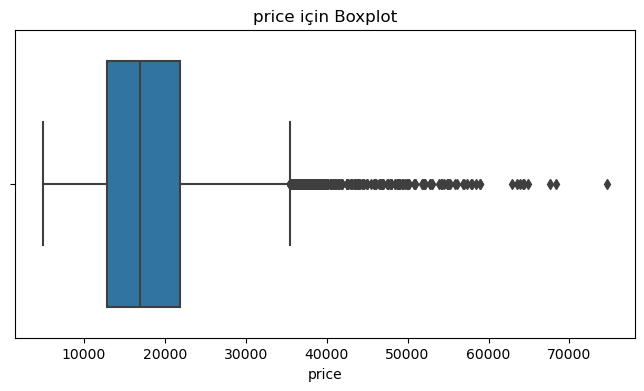

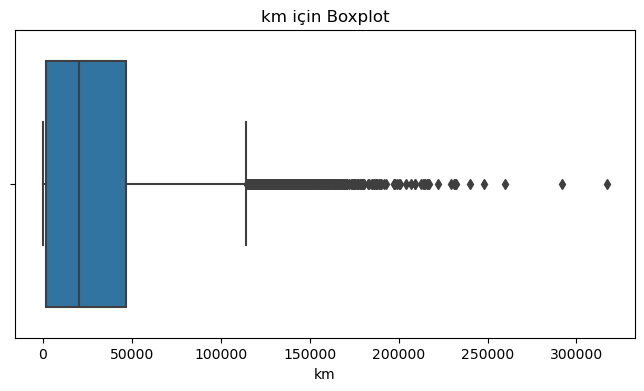

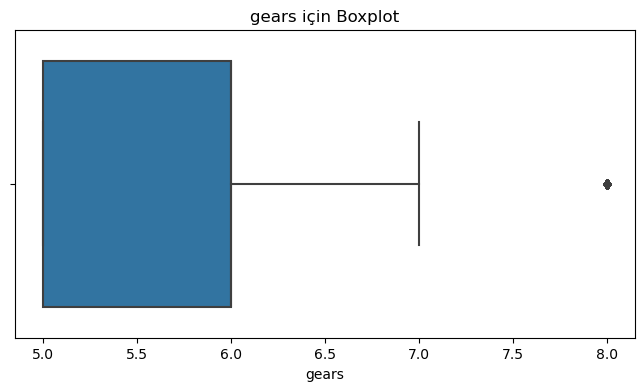

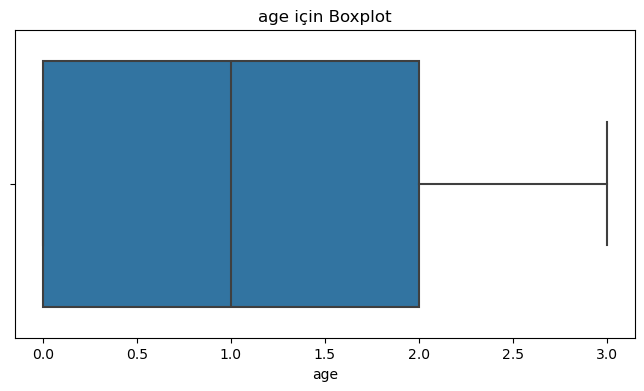

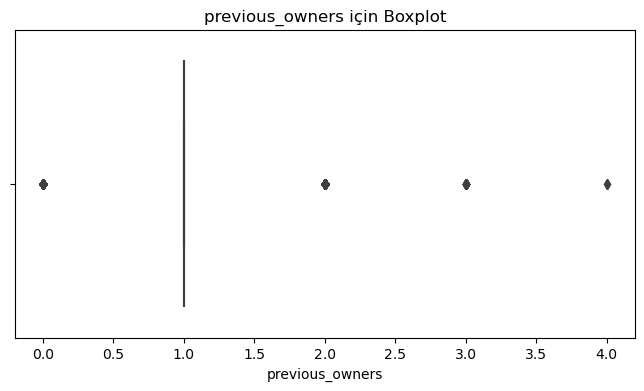

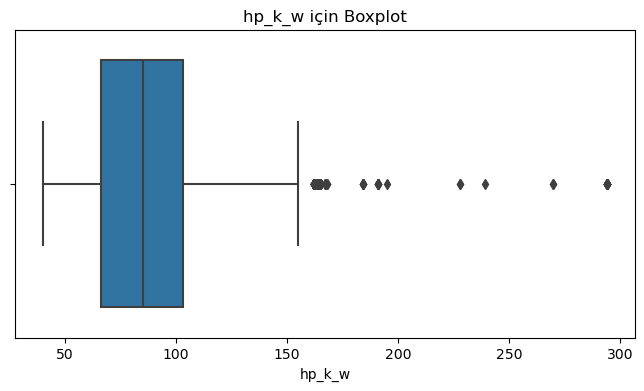

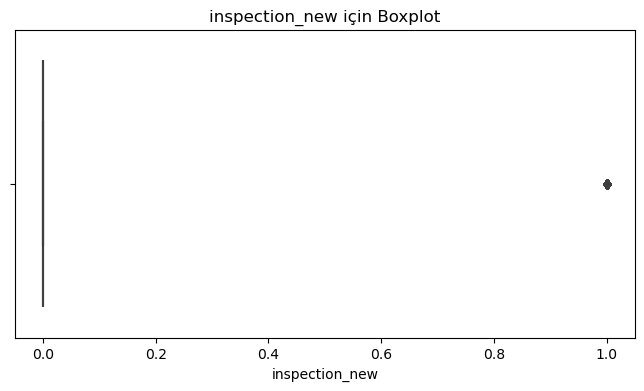

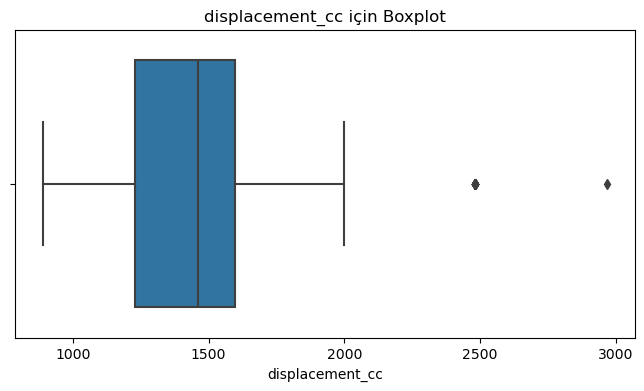

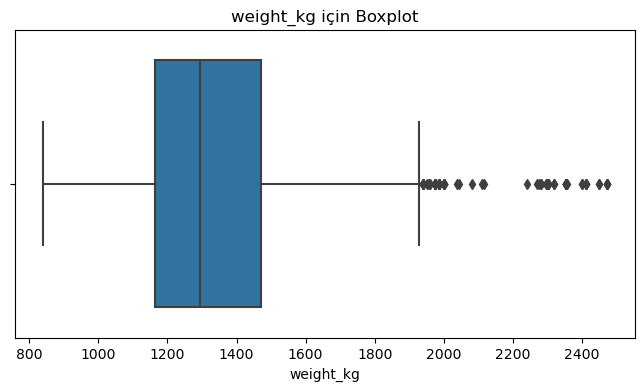

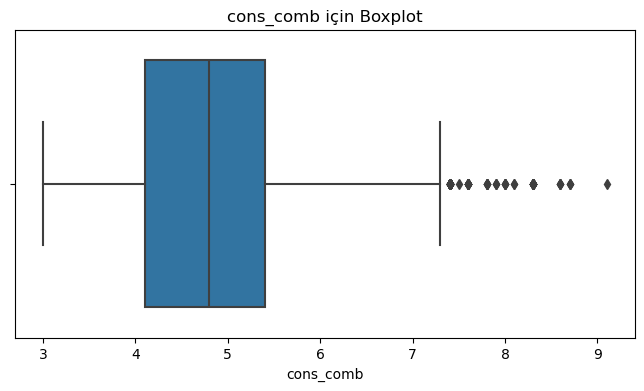

In [577]:
for col in df.select_dtypes(include=['number']).columns:
    plt.figure(figsize=(8, 4))
    sns.boxplot(x=df1[col])
    plt.title(f"{col} için Boxplot")
    plt.show()

In [578]:
df1.describe().T

,count,mean,std,min,25%,50%,75%,max
price,15915.0,18024.380584,7381.679318,4950.0,12850.0,16900.0,21900.0,74600.0
km,15915.0,32089.995708,36977.214964,0.0,1920.5,20413.0,46900.0,317000.0
gears,15915.0,5.937355,0.704772,5.0,5.0,6.0,6.0,8.0
age,15915.0,1.389695,1.121306,0.0,0.0,1.0,2.0,3.0
previous_owners,15915.0,1.042853,0.339178,0.0,1.0,1.0,1.0,4.0
hp_k_w,15915.0,88.499340,26.674341,40.0,66.0,85.0,103.0,294.0
inspection_new,15915.0,0.247063,0.431317,0.0,0.0,0.0,0.0,1.0
displacement_cc,15915.0,1428.661891,275.804272,890.0,1229.0,1461.0,1598.0,2967.0
weight_kg,15915.0,1337.700534,199.682385,840.0,1165.0,1295.0,1472.0,2471.0
cons_comb,15915.0,4.832124,0.867530,3.0,4.1,4.8,5.4,9.1


In [809]:
def remove_all_outliers_except(df1, except_columns):
    cleaned_df = df1.copy()
    for column in df1.select_dtypes(include=['float64', 'int64']).columns:
        if column not in except_columns:
            Q1 = df1[column].quantile(0.25)
            Q3 = df1[column].quantile(0.75)
            IQR = Q3 - Q1
            lower_bound = Q1 - 1.5 * IQR
            upper_bound = Q3 + 1.5 * IQR
            
            # Aykırı olmayan değerleri filtrele
            cleaned_df = cleaned_df[(cleaned_df[column] >= lower_bound) & (cleaned_df[column] <= upper_bound)]
        
    return cleaned_df

# 'Inspection_new' ve 'Previous_Owners' sütunları hariç tüm DataFrame üzerinde aykırı değerleri temizleme
except_columns = ['inspection_new', 'previous_owners']
df= remove_all_outliers_except(df1, except_columns)

# Temizlenmiş veri setinin temel istatistiklerini göster
df.describe().T


,count,mean,std,min,25%,50%,75%,max
price,14283.0,17323.612546,6014.527020,4990.0,12788.0,16790.0,21490.0,35450.0
km,14283.0,28051.162758,29045.724496,0.0,2348.5,20000.0,42627.5,114300.0
gears,14283.0,5.889659,0.676702,5.0,5.0,6.0,6.0,7.0
age,14283.0,1.365749,1.096561,0.0,0.0,1.0,2.0,3.0
previous_owners,14283.0,1.045929,0.348228,0.0,1.0,1.0,1.0,4.0
hp_k_w,14283.0,84.648883,21.880738,40.0,66.0,85.0,100.0,150.0
inspection_new,14283.0,0.249457,0.432714,0.0,0.0,0.0,0.0,1.0
displacement_cc,14283.0,1394.938808,261.189236,890.0,1197.0,1422.0,1598.0,2000.0
weight_kg,14283.0,1316.703914,181.804671,840.0,1163.0,1275.0,1425.0,1929.0
cons_comb,14283.0,4.778373,0.800280,3.0,4.1,4.8,5.4,7.3


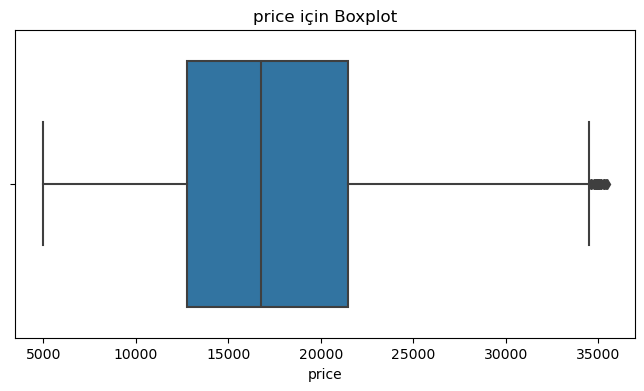

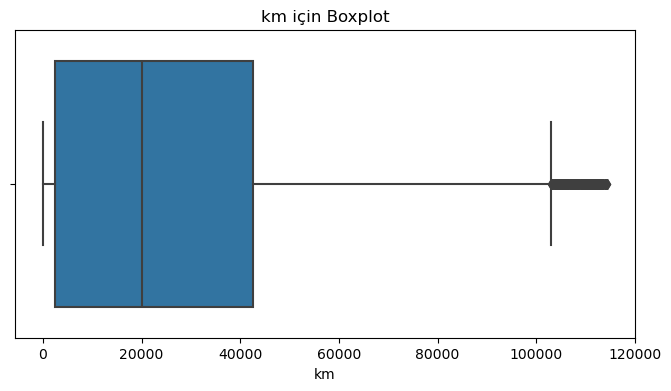

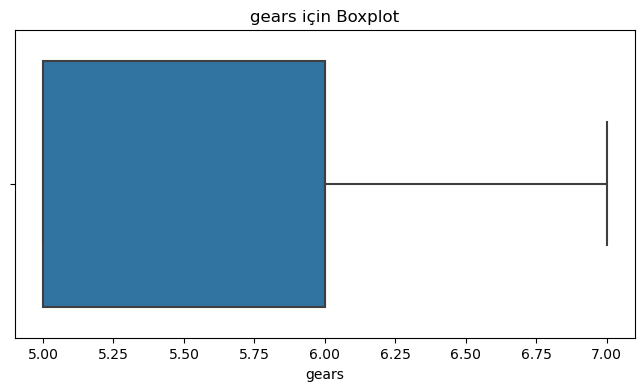

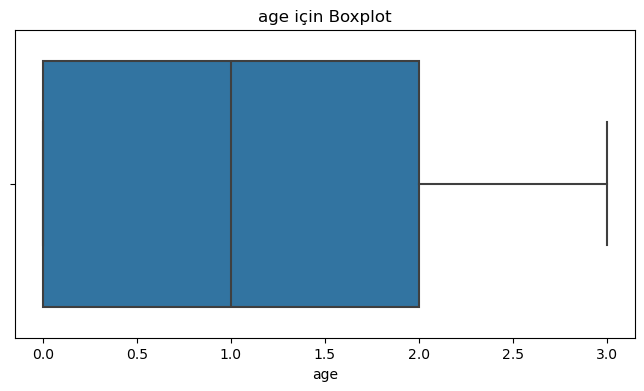

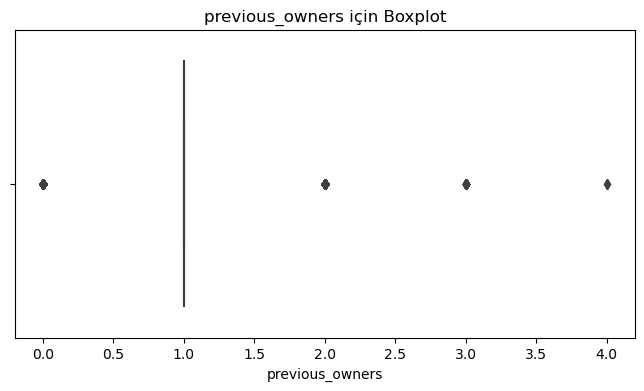

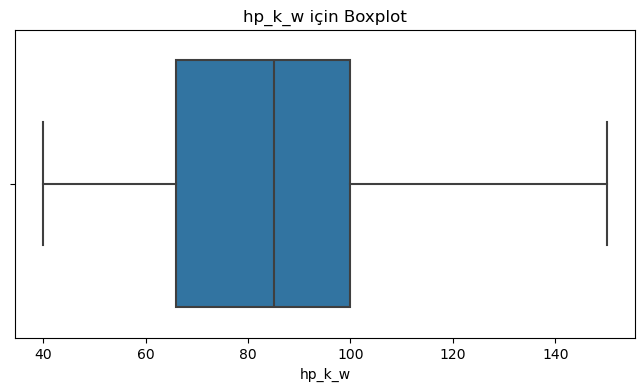

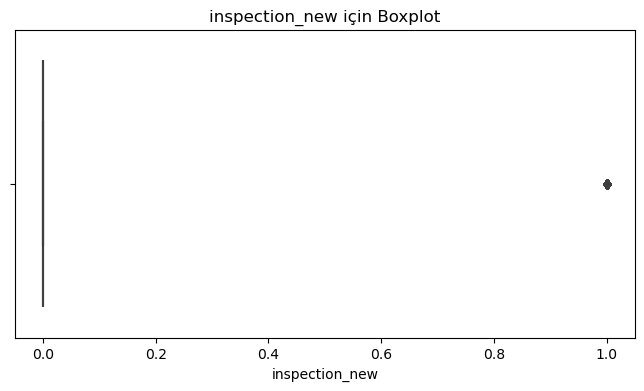

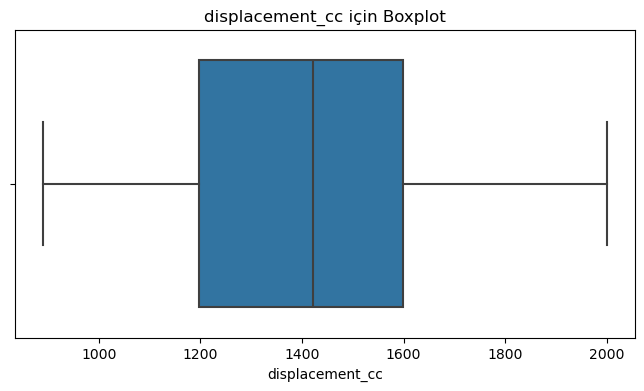

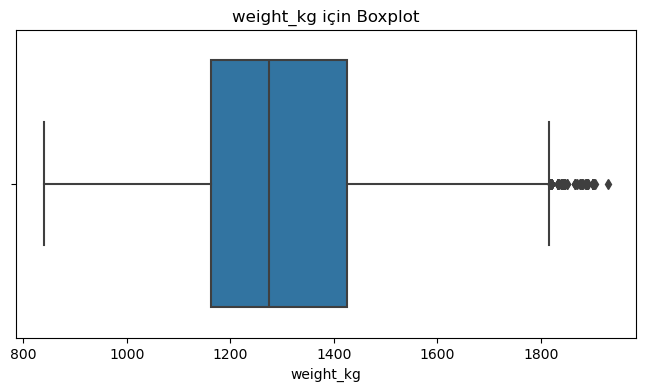

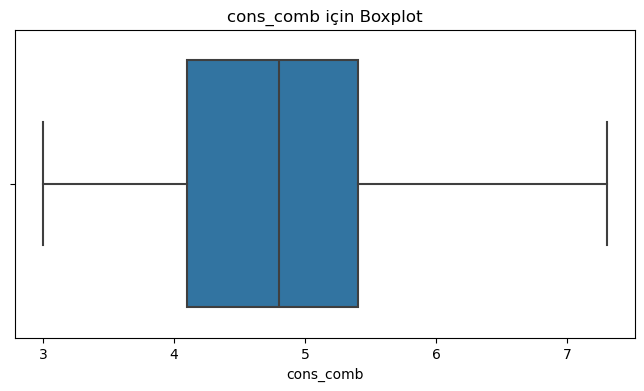

In [810]:
for col in df.select_dtypes(include=['number']).columns:
    plt.figure(figsize=(8, 4))
    sns.boxplot(x=df[col])
    plt.title(f"{col} için Boxplot")
    plt.show()

def remove_outliers_specific_columns(df, columns):
    cleaned_df = df.copy()
    for column in columns:
        if column in df.columns:
            Q1 = df[column].quantile(0.25)
            Q3 = df[column].quantile(0.75)
            IQR = Q3 - Q1
            lower_bound = Q1 - 1.5 * IQR
            upper_bound = Q3 + 1.5 * IQR
            
            # Aykırı olmayan değerleri filtrele
            cleaned_df = cleaned_df[(cleaned_df[column] >= lower_bound) & (cleaned_df[column] <= upper_bound)]
    return cleaned_df

specific_columns = ['price', 'km']  
cleaned_df_specific = remove_outliers_specific_columns(df, specific_columns)

cleaned_df_specific.describe().T


def remove_all_outliers(df):
    cleaned_df = df.copy()
    for column in df.select_dtypes(include=['float64', 'int64']).columns:
        Q1 = df[column].quantile(0.25)
        Q3 = df[column].quantile(0.75)
        IQR = Q3 - Q1
        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR
        
        cleaned_df = cleaned_df[(cleaned_df[column] >= lower_bound) & (cleaned_df[column] <= upper_bound)]
        
    return cleaned_df
df2 = remove_all_outliers(df)
df2.describe().T


def remove_outliers(df, column):
    Q1 = df[column].quantile(0.25)
    Q3 = df[column].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    
    return df[(df[column] >= lower_bound) & (df[column] <= upper_bound)]

##### Örnek olarak 'price' sütunu için aykırı değerleri temizleme
df1= remove_outliers(df, 'price')
df1.describe().T

In [583]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
price,14283.0,17323.612546,6014.527020,4990.0,12788.0,16790.0,21490.0,35450.0
km,14283.0,28051.162758,29045.724496,0.0,2348.5,20000.0,42627.5,114300.0
gears,14283.0,5.889659,0.676702,5.0,5.0,6.0,6.0,7.0
age,14283.0,1.365749,1.096561,0.0,0.0,1.0,2.0,3.0
previous_owners,14283.0,1.045929,0.348228,0.0,1.0,1.0,1.0,4.0
hp_k_w,14283.0,84.648883,21.880738,40.0,66.0,85.0,100.0,150.0
inspection_new,14283.0,0.249457,0.432714,0.0,0.0,0.0,0.0,1.0
displacement_cc,14283.0,1394.938808,261.189236,890.0,1197.0,1422.0,1598.0,2000.0
weight_kg,14283.0,1316.703914,181.804671,840.0,1163.0,1275.0,1425.0,1929.0
cons_comb,14283.0,4.778373,0.800280,3.0,4.1,4.8,5.4,7.3


In [584]:
for column in df.columns:
    unique_values = df[column].unique()
    unique_count = len(unique_values)
# Note: For columns with a large number of unique values, printing all values might not be practical.
    # Therefore, if there are more than 10 unique values, only the first 10 are displayed.
   
    print(f"\033[1m\033[91mColumn:\033[0m \033[1m\033[94m{column}\033[0m")
    print(f"\033[1m\033[92mNumber of Unique Values:\033[93m {unique_count}")
    
    if unique_count <= 10:
        print(f"\033[1mUnique Values:\033[0m {unique_values}\n")
    else:
        print(f"\033[95mFirst 10 Unique Values:\033[0m {unique_values[:10]}")
        print(f"... and {unique_count - 10} more unique values\n")

Column: make_model
Number of Unique Values: 9
Unique Values: ['Audi A1' 'Audi A2' 'Audi A3' 'Opel Astra' 'Opel Corsa' 'Opel Insignia'
 'Renault Clio' 'Renault Duster' 'Renault Espace']

Column: body_type
Number of Unique Values: 8
Unique Values: ['Sedans' 'Station wagon' 'Compact' 'Coupe' 'Van' 'Off-Road' 'Convertible'
 'Transporter']

Column: price
Number of Unique Values: 2555
First 10 Unique Values: [15770 14500 14640 16790 15090 16422 14480 16700 17990 18500]
... and 2545 more unique values

Column: vat
Number of Unique Values: 2
Unique Values: ['VAT deductible' 'Price negotiable']

Column: km
Number of Unique Values: 6062
First 10 Unique Values: [56013. 80000. 83450. 73000. 16200. 63668. 62111. 14986. 57000. 16103.]
... and 6052 more unique values

Column: type
Number of Unique Values: 5
Unique Values: ['Used' "Employee's car" 'New' 'Demonstration' 'Pre-registered']

Column: fuel
Number of Unique Values: 4
Unique Values: ['Diesel' 'Benzine' 'LPG/CNG' 'Electric']

Column: gears
Num

In [511]:
unique_make_models = df['make_model'].unique()

for make_model in unique_make_models:
    fuel_types = df[df['make_model'] == make_model]['fuel'].unique()
    print(f"The fuel type(s) for {make_model}: {fuel_types}")

The fuel type(s) for Audi A1: ['Diesel' 'Benzine']
The fuel type(s) for Audi A2: ['Diesel']
The fuel type(s) for Audi A3: ['Benzine' 'Diesel' 'LPG/CNG' 'Electric']
The fuel type(s) for Opel Astra: ['Diesel' 'Benzine' 'LPG/CNG']
The fuel type(s) for Opel Corsa: ['Benzine' 'LPG/CNG' 'Diesel']
The fuel type(s) for Opel Insignia: ['Diesel' 'Benzine']
The fuel type(s) for Renault Clio: ['Diesel' 'Benzine' 'Electric' 'LPG/CNG']
The fuel type(s) for Renault Duster: ['Benzine']
The fuel type(s) for Renault Espace: ['Diesel' 'Benzine']


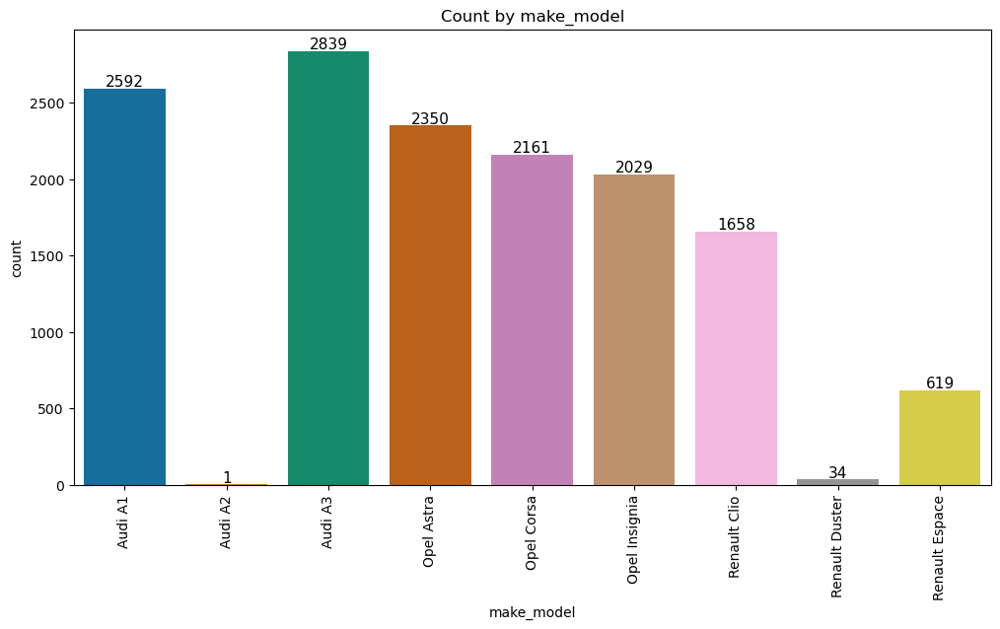

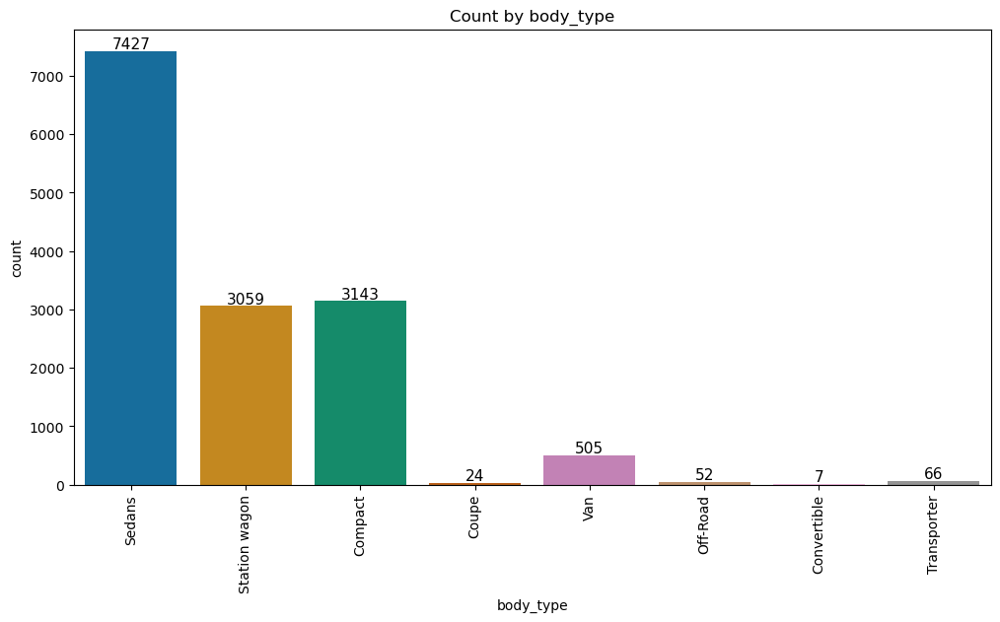

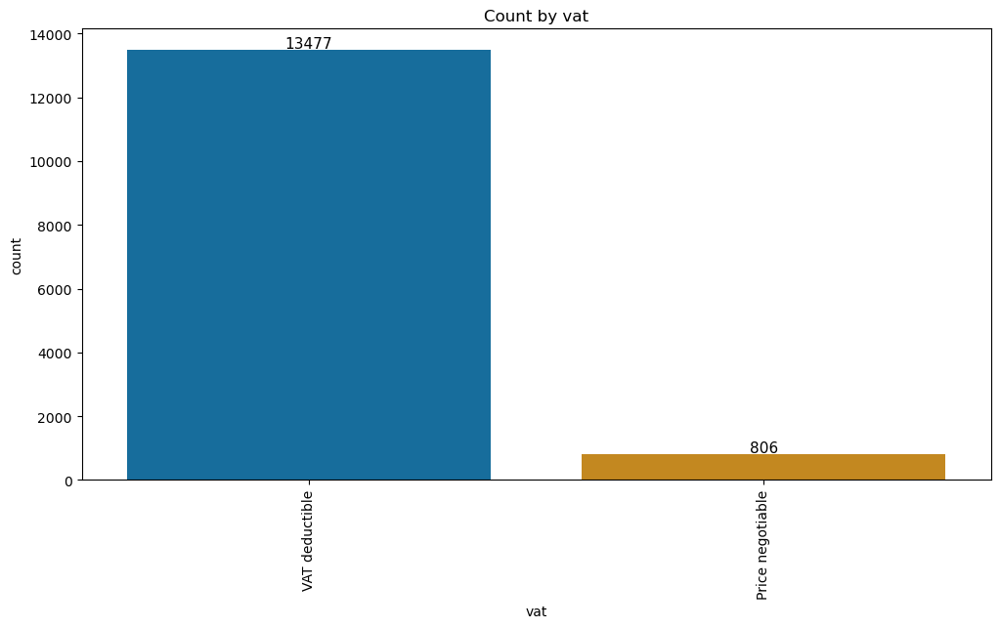

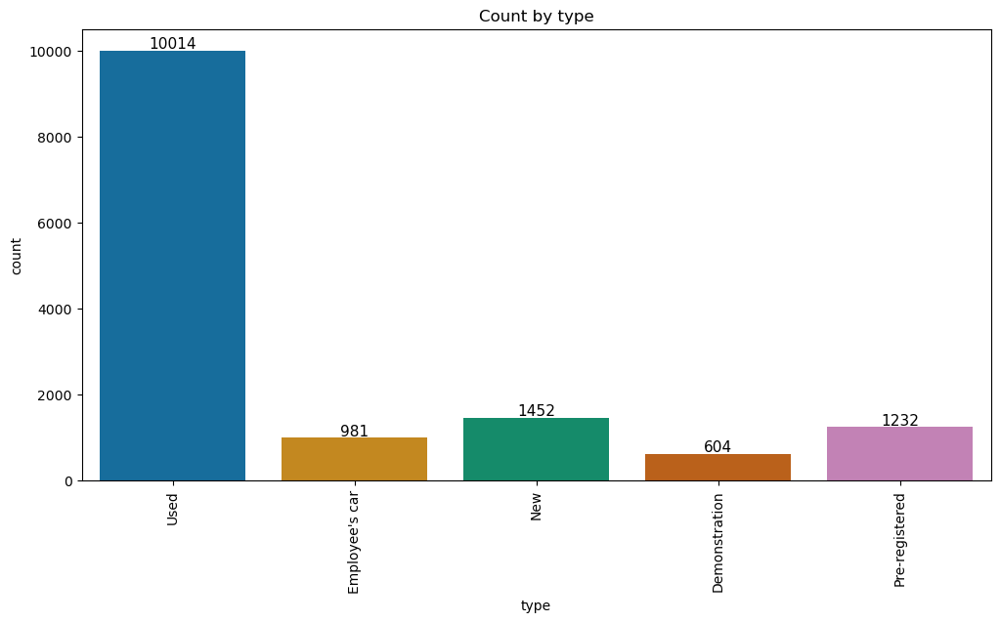

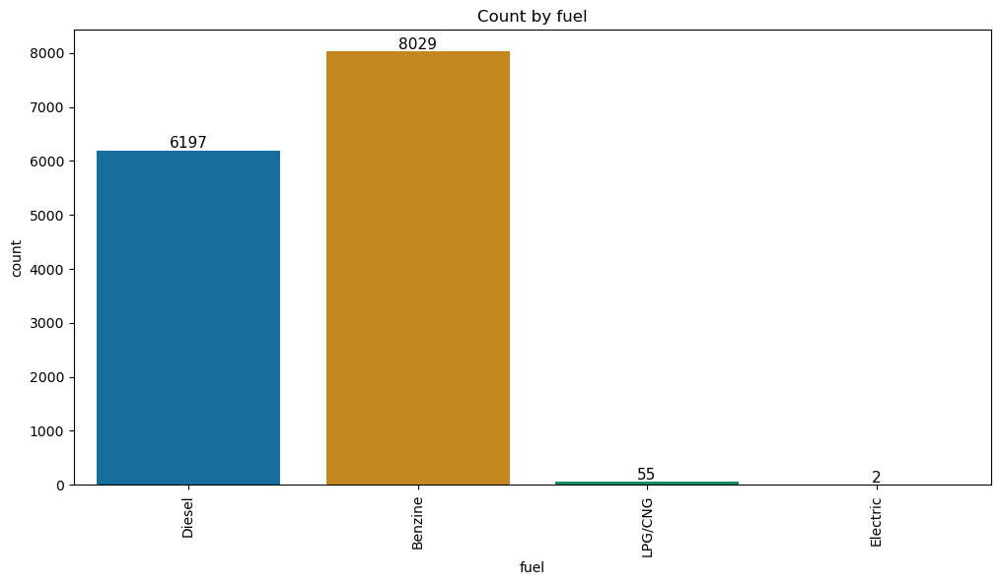

...

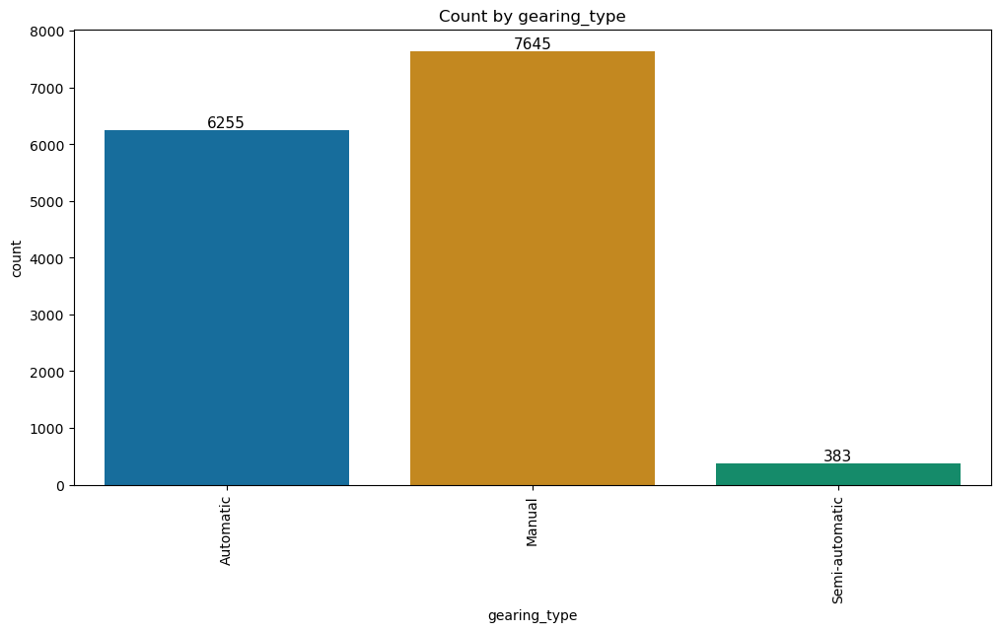

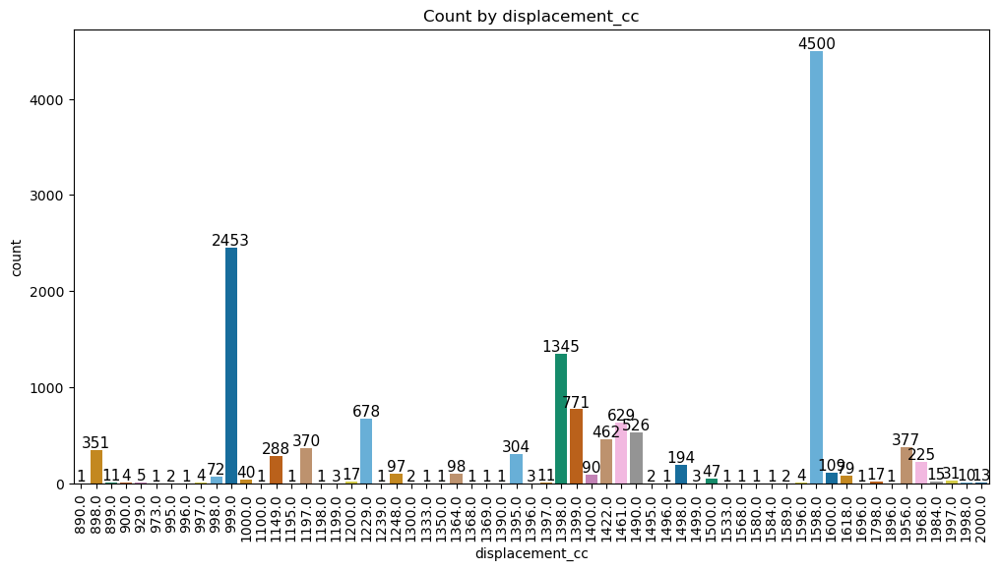

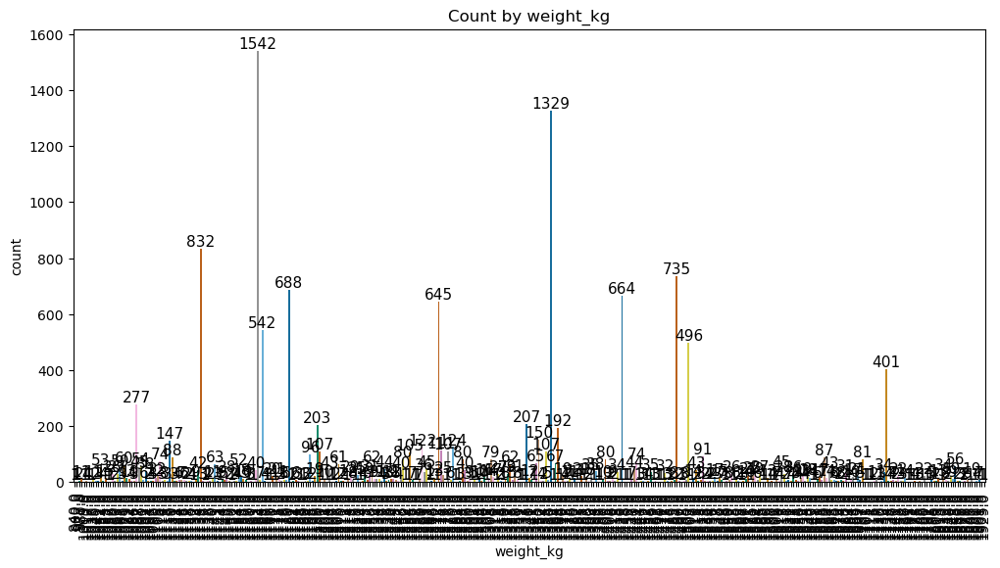

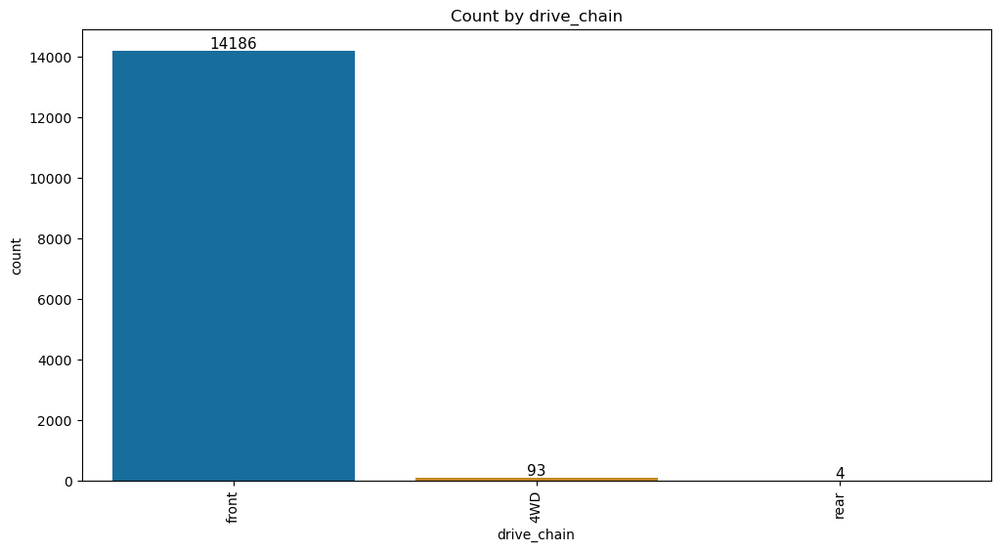

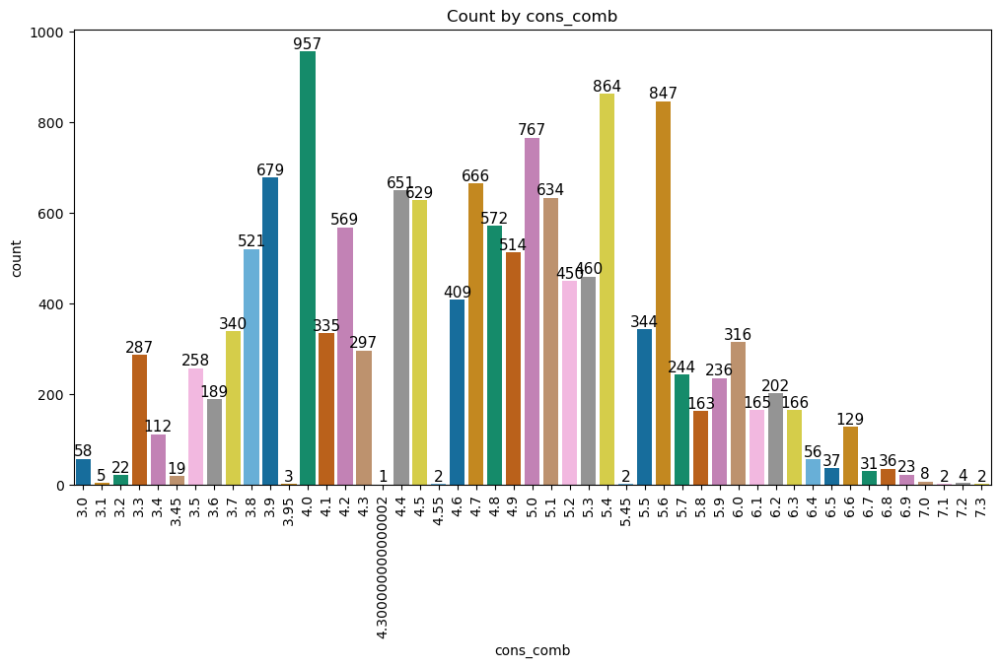

In [586]:

max_unique_values = 500

for col in df.columns:
    if col in df and df[col].nunique() <= max_unique_values:
        plt.figure(figsize=(12, 6))
        ax = sns.countplot(x=col, data= df, palette="colorblind")
        
        plt.title(f"Count by {col}")
        plt.xticks(rotation=90)  # Rotate x-axis labels for better readability
        
        # Adding counts above each bar
        for p in ax.patches:
            ax.annotate(f'{int(p.get_height())}', (p.get_x() + p.get_width() / 2., p.get_height()),
                        ha='center', va='center', fontsize=11, color='black', xytext=(0, 5),
                        textcoords='offset points')
        
        plt.show()

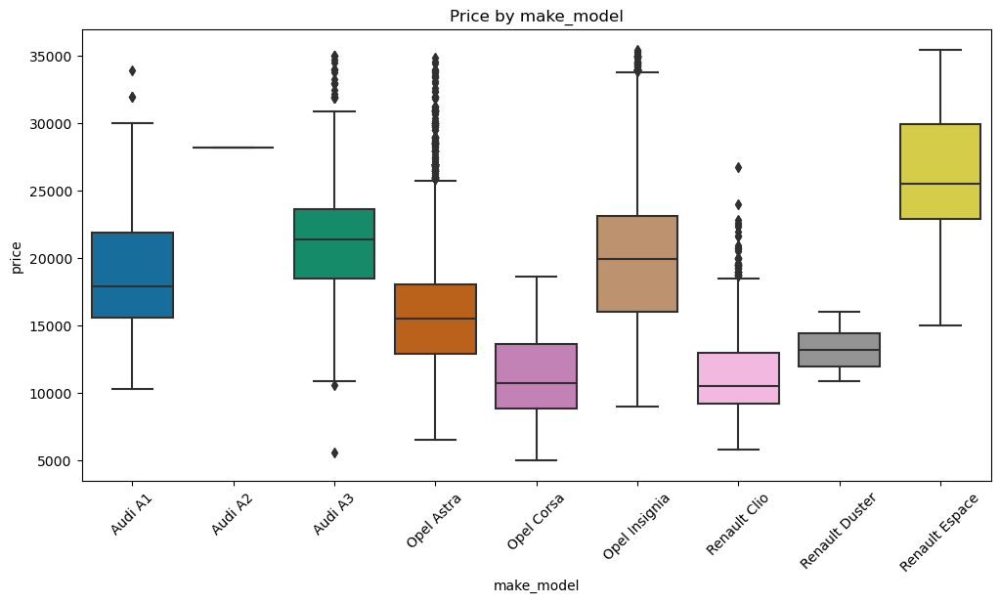

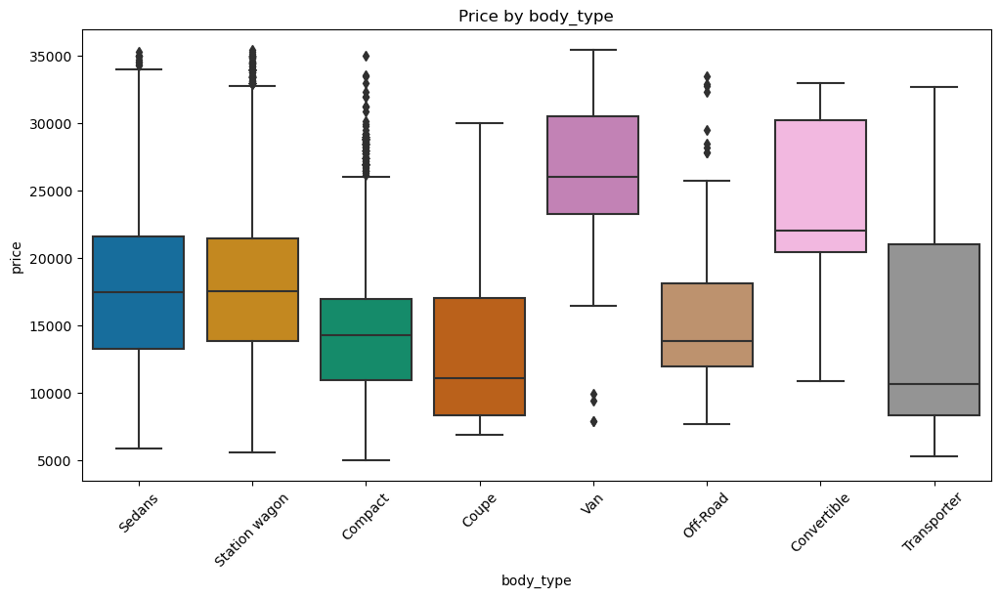

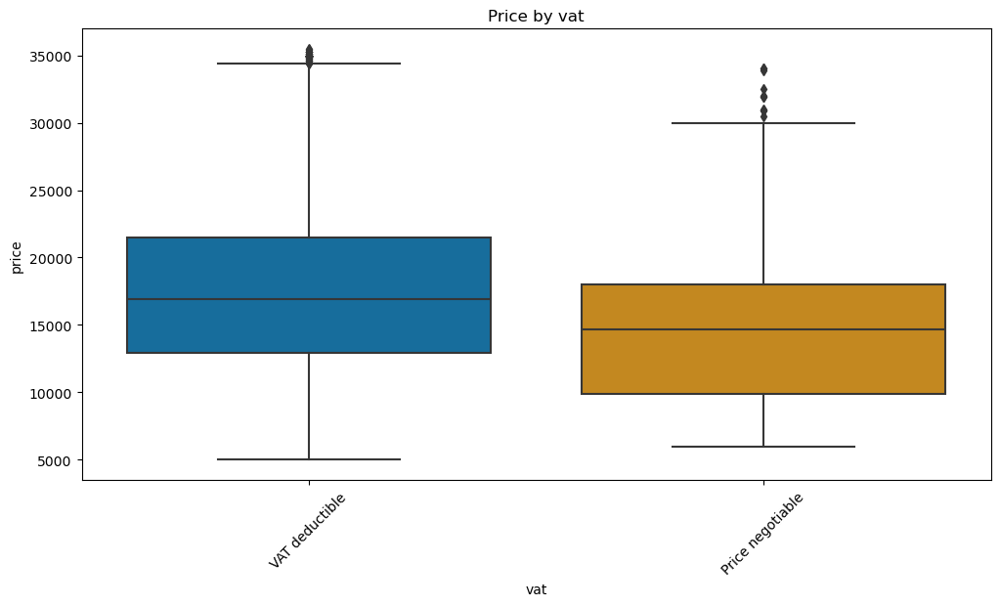

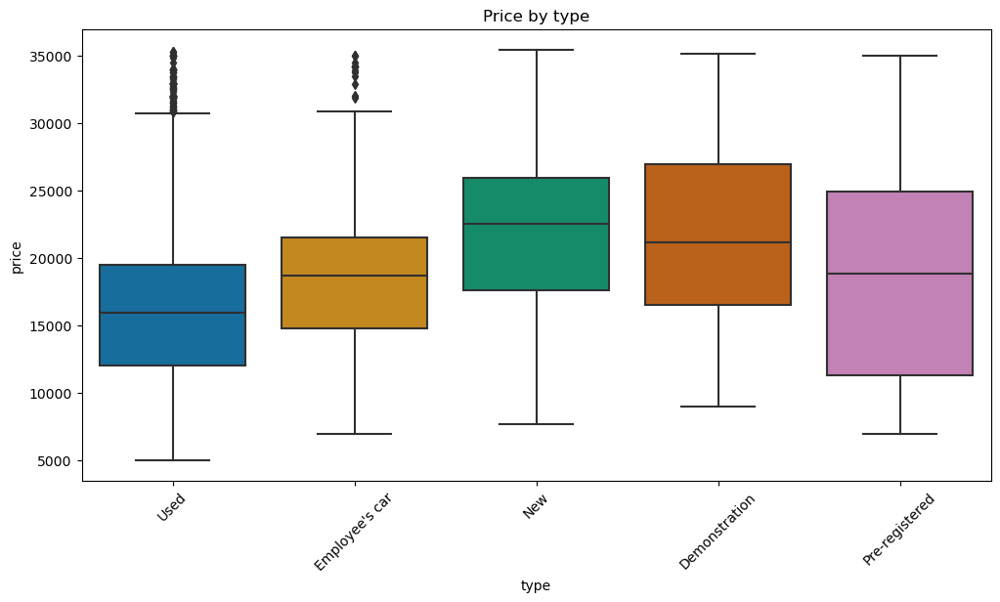

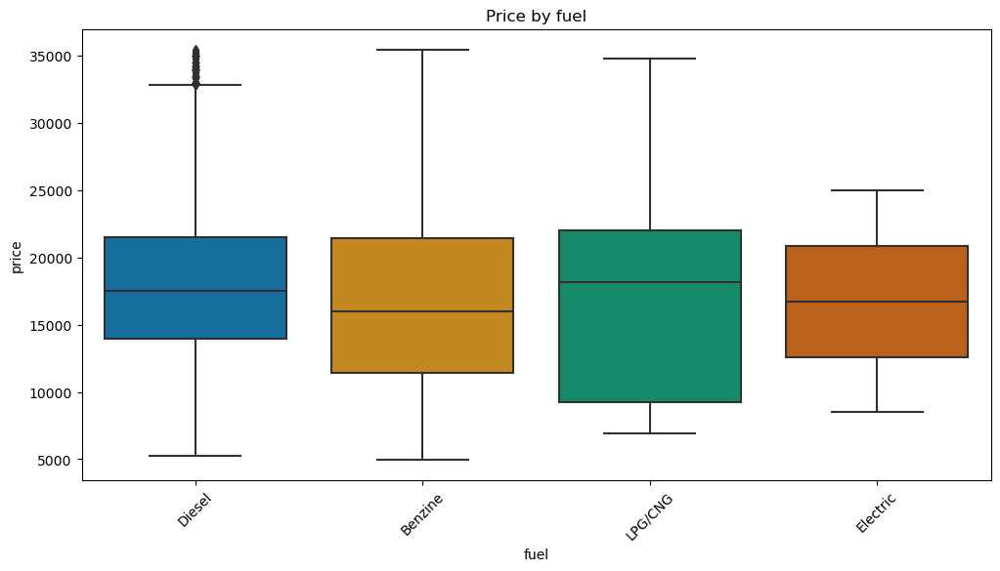

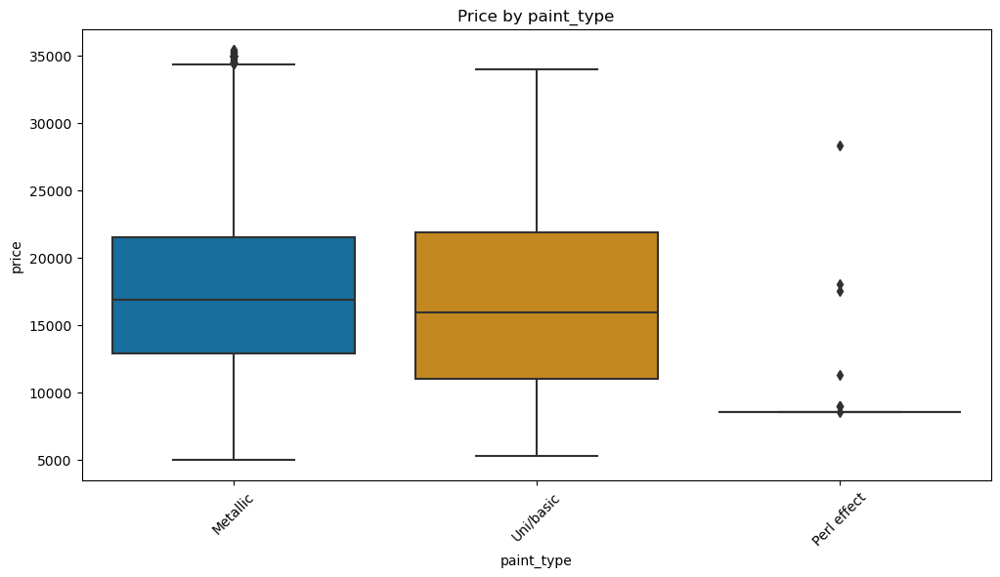

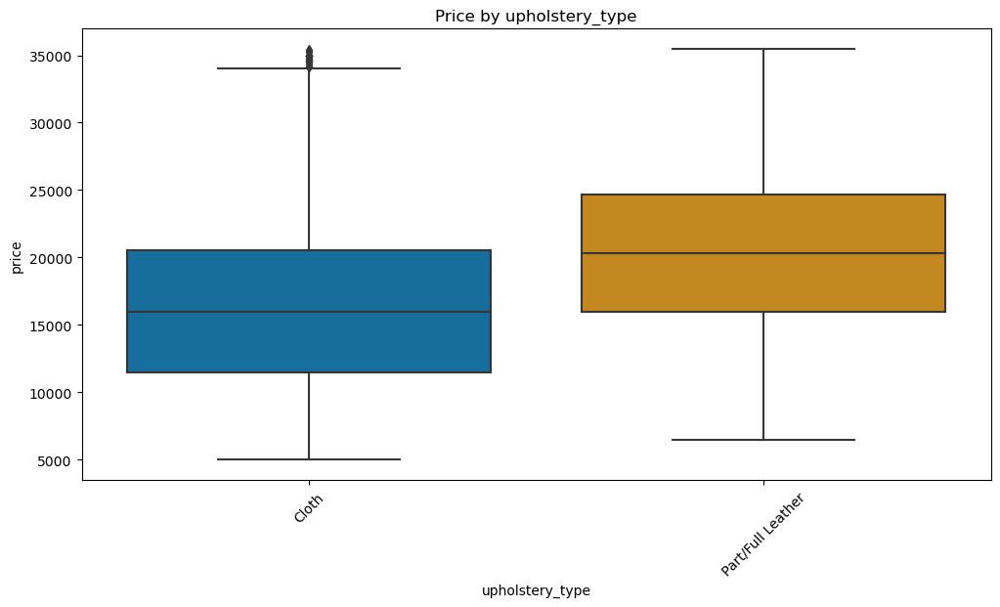

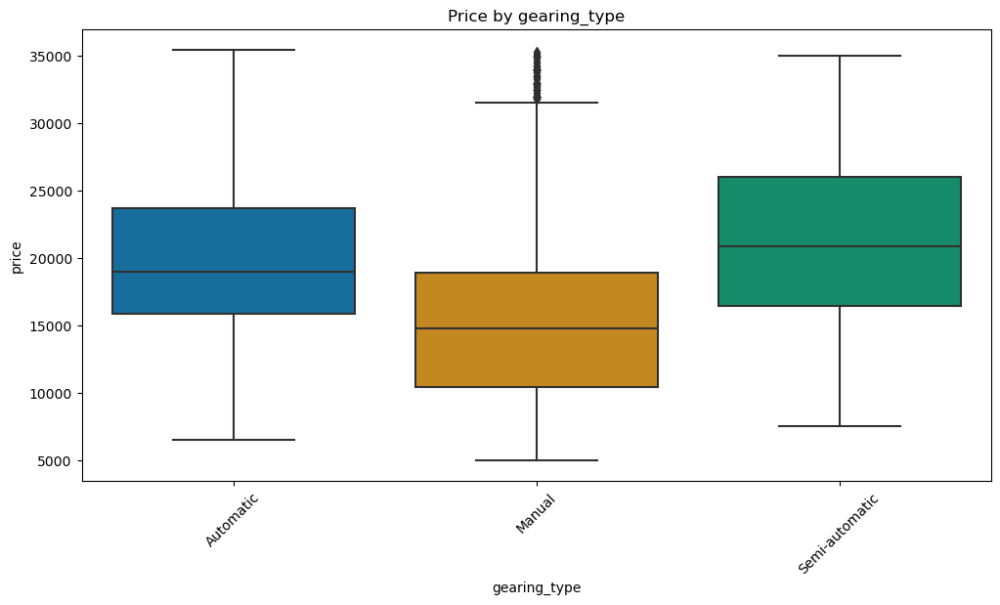

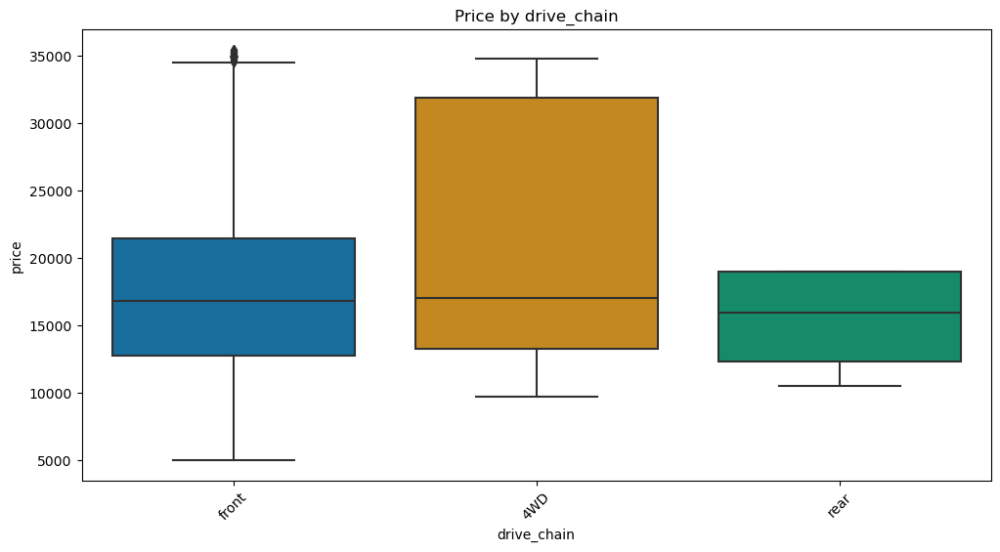

In [587]:
exclude_columns =  df.select_dtypes(include=['number']).columns.tolist()

# Optionally, you might want to limit the number of unique values for categorical plots
max_unique_values = 300

for col in df.columns:
    # Skip over the excluded columns and columns with too many unique values
    if col not in exclude_columns and df[col].nunique() <= max_unique_values:
        plt.figure(figsize=(12, 6))
        sns.boxplot(x=col, y="price", data=df, palette="colorblind")
        
        plt.title(f"Price by {col}")
        plt.xticks(rotation=45)  # Rotate x-axis labels for better readability
        plt.show()

In [588]:
numeric_cols = df.select_dtypes(include=['number']).columns

for col_name in numeric_cols:
    
    column_skewness = skew(df[col_name].dropna())
    print(f"{col_name}: {column_skewness}")

price: 0.4413906156491464
km: 1.1084266171758197
gears: 0.1374093346087261
age: 0.19870321980645833
previous_owners: 1.0479620866896677
hp_k_w: 0.5456539912258429
inspection_new: 1.1580457401344582
displacement_cc: -0.19829480548839593
weight_kg: 0.8949788535823484
cons_comb: 0.16758421552253572


**Since each of these values is close to +1, we can say that the distributions are slightly to moderately right-skewed. This may necessitate the application of some data transformations or normalization techniques during the data analysis and modeling process.**

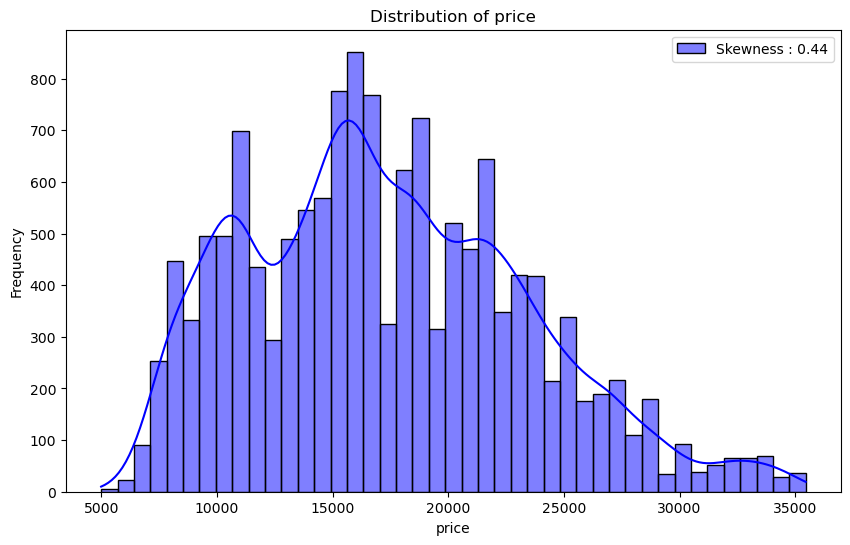

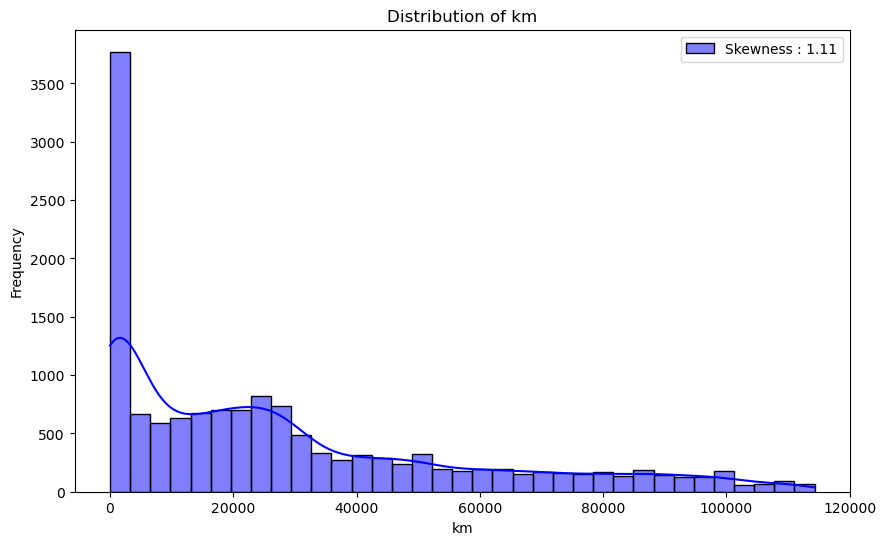

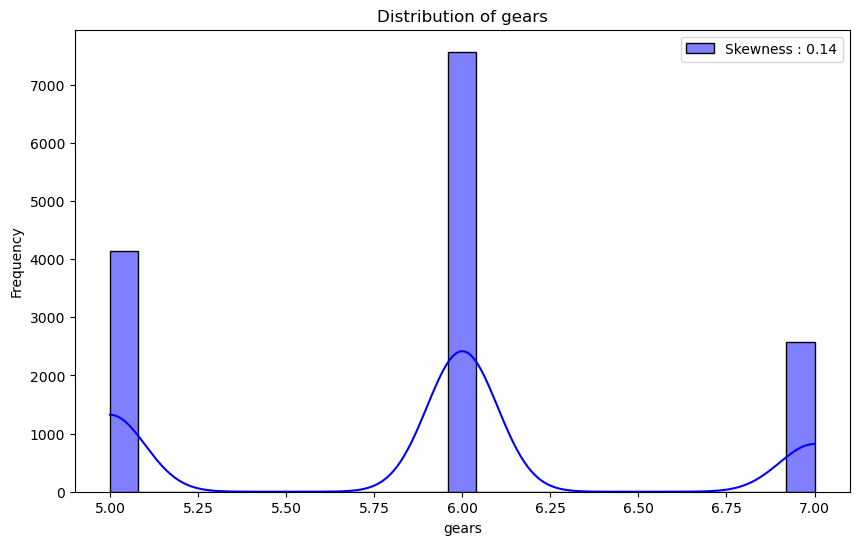

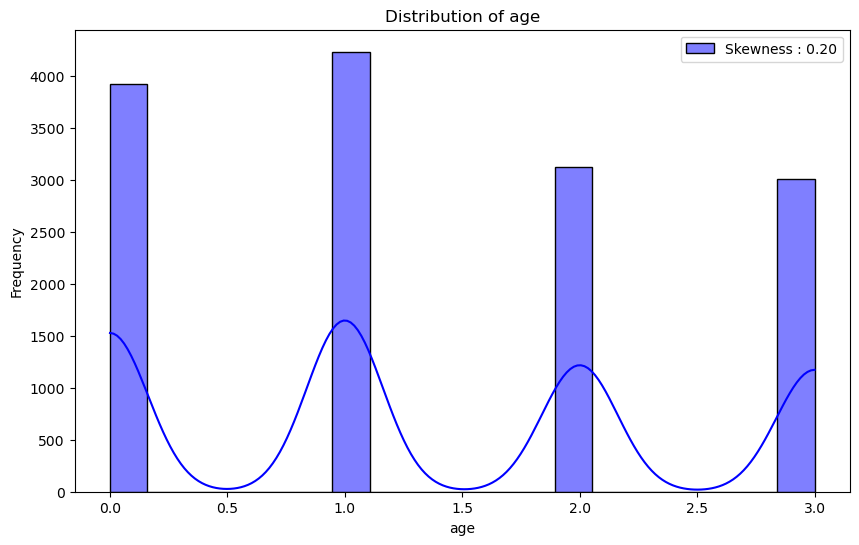

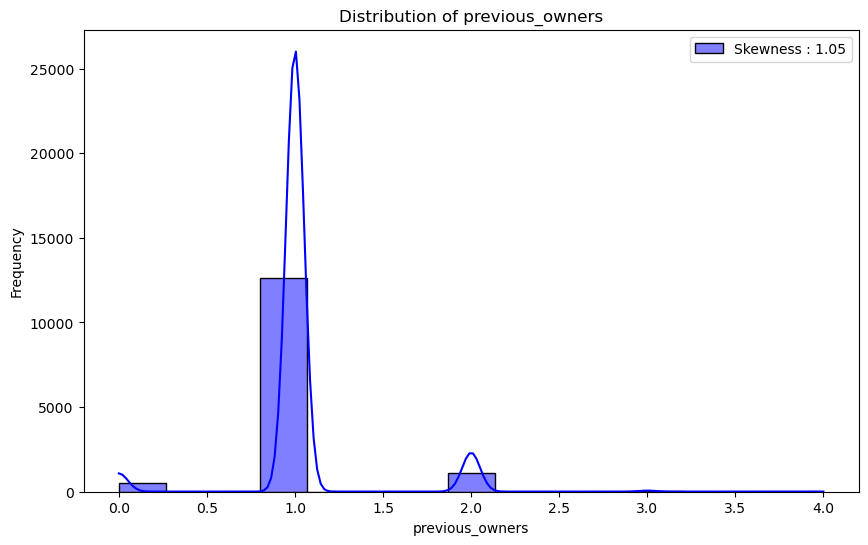

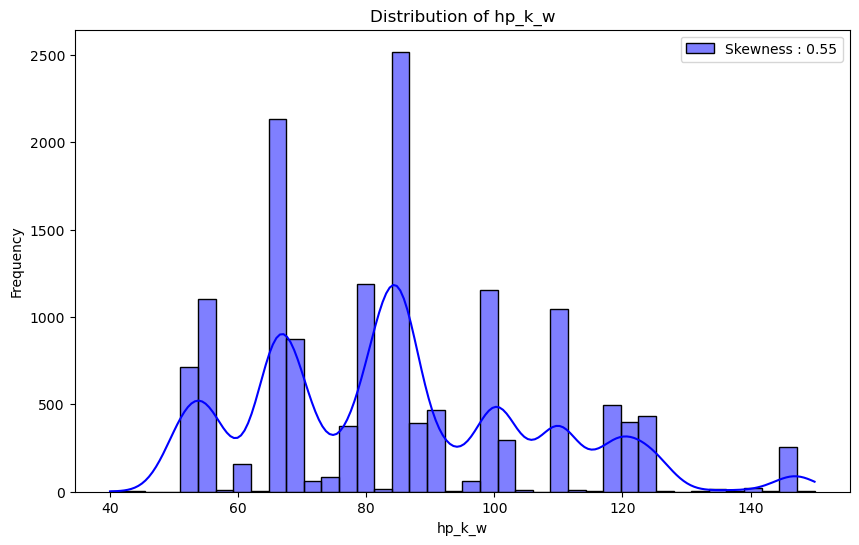

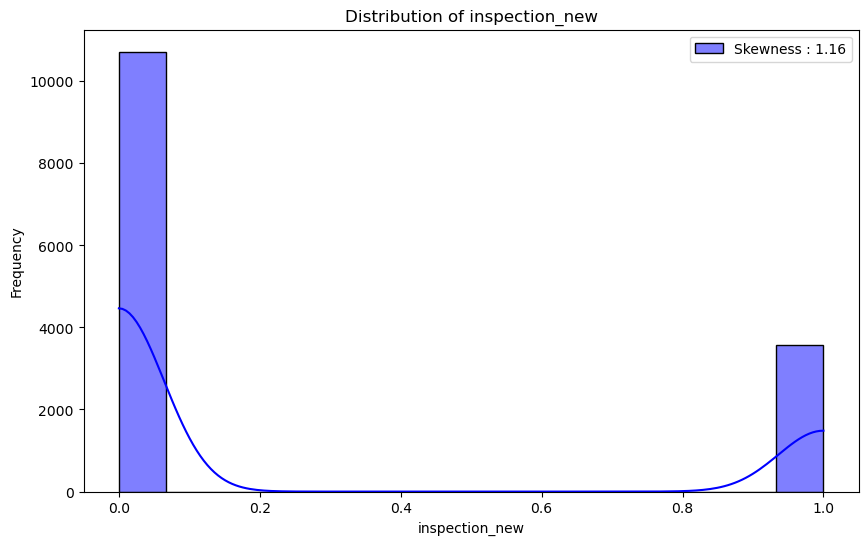

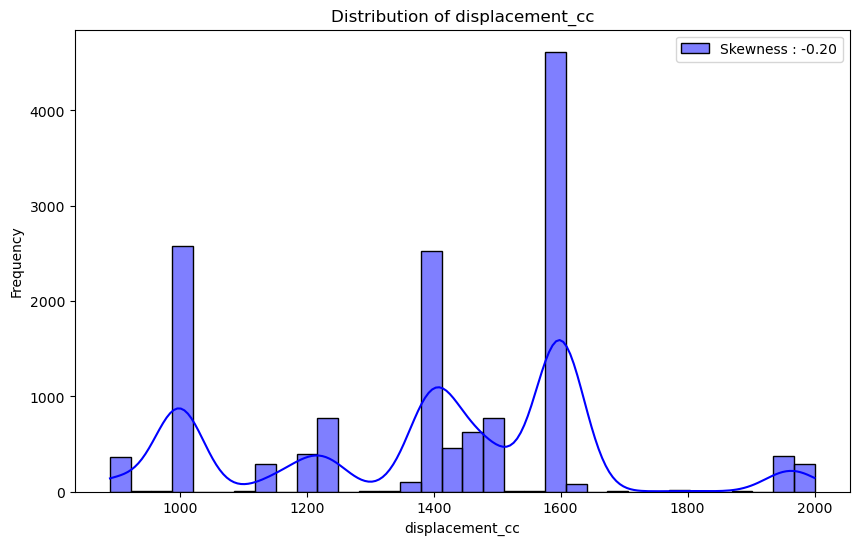

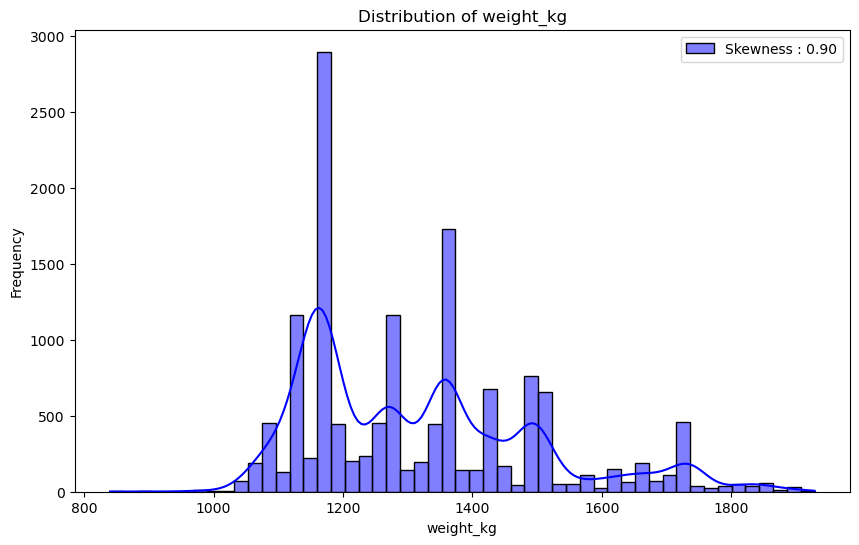

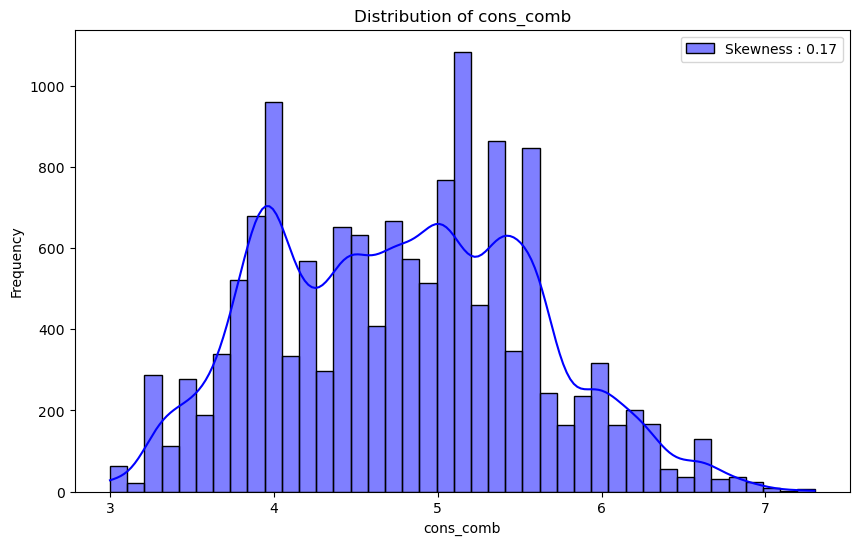

In [589]:
numeric_cols = df.select_dtypes(include=['number']).columns

for col in numeric_cols:
     
    g = sns.histplot(df[col], color="b", kde=True, label=f"Skewness : {df[col].skew():.2f}")
    
    plt.legend(loc="best")
    plt.title(f"Distribution of {col}")
    plt.xlabel(col)
    plt.ylabel('Frequency')
    plt.show()

In [590]:
import plotly.graph_objects as go

# Assuming df_filtered is your DataFrame after dropping "CO2 Emissions(g/km)"
numeric_cols = df.select_dtypes(include=['number']).columns

for col in numeric_cols:
    # Step 1: Binning the data with qcut and ensuring no duplicate bins
    df[f"{col}_bin"] = pd.qcut(df[col], q=4, duplicates='drop')
    
    # Convert Interval objects to strings for Plotly compatibility
    df[f"{col}_bin_str"] = df[f"{col}_bin"].astype(str)
    
    # Step 2: Calculating proportions
    bin_counts = df[f"{col}_bin_str"].value_counts(normalize=True)
    
    # Step 3: Plotting with Plotly
    fig = go.Figure(data=[go.Pie(labels=bin_counts.index, values=bin_counts.values, title=f"Distribution of {col}")])
    
    fig.update_traces(textposition='inside', textinfo='percent+label')
    fig.show()

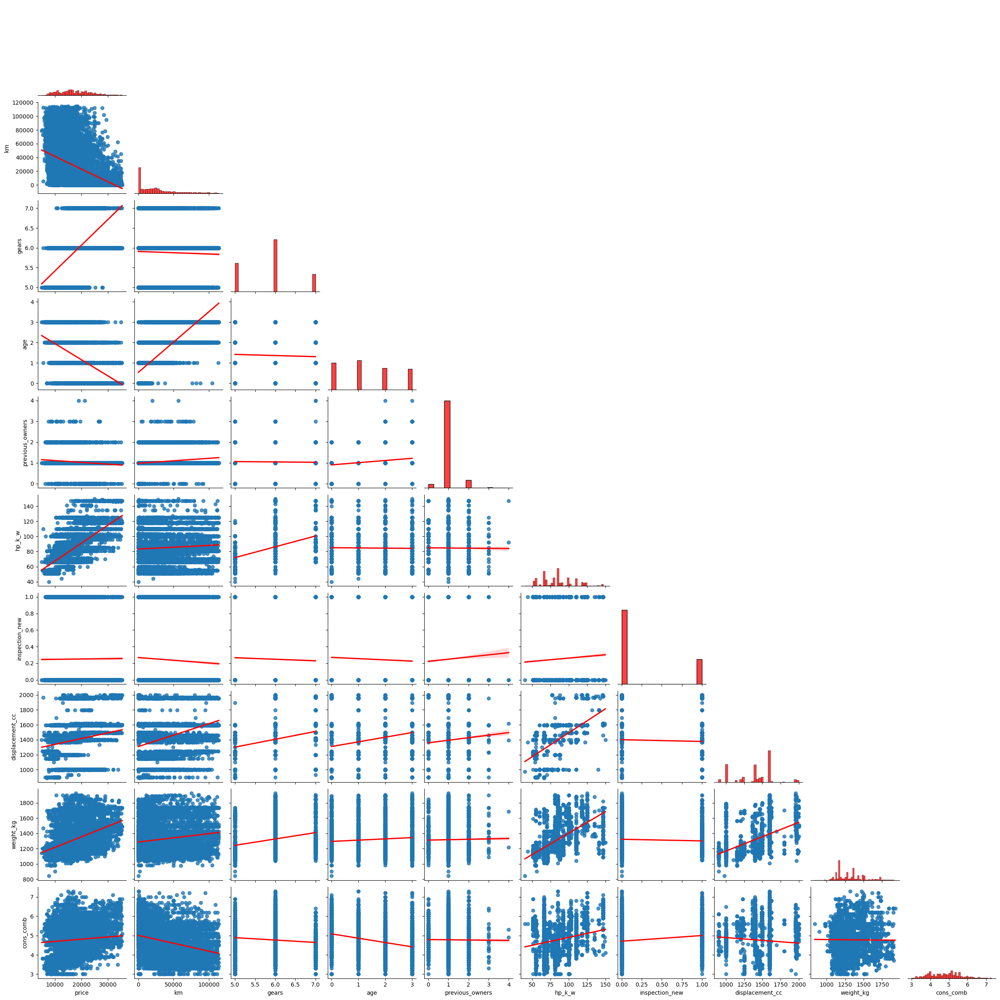

In [591]:
sns.pairplot(df, kind = "reg", diag_kind = "hist", diag_kws={"color":"red"}, plot_kws={"line_kws":{"color":"red"}},
             corner=True)

plt.show()

In [811]:
corr=df.corr(numeric_only=True)
corr

,price,km,gears,age,previous_owners,hp_k_w,inspection_new,displacement_cc,weight_kg,cons_comb
price,1.000000,-0.379686,0.576557,-0.434147,-0.148580,0.651863,0.005432,0.175967,0.456522,0.086285
km,-0.379686,1.000000,-0.027012,0.789056,0.198694,0.063994,-0.043773,0.339046,0.174211,-0.296090
gears,0.576557,-0.027012,1.000000,-0.034307,-0.033462,0.443976,-0.029138,0.271554,0.310632,-0.104556
age,-0.434147,0.789056,-0.034307,1.000000,0.331902,-0.016137,-0.037801,0.261508,0.099767,-0.307217
previous_owners,-0.148580,0.198694,-0.033462,0.331902,1.000000,-0.003783,0.021076,0.045446,0.010216,-0.004940
hp_k_w,0.651863,0.063994,0.443976,-0.016137,-0.003783,1.000000,0.040319,0.535808,0.676739,0.224731
inspection_new,0.005432,-0.043773,-0.029138,-0.037801,0.021076,0.040319,1.000000,-0.038793,-0.050603,0.158956
displacement_cc,0.175967,0.339046,0.271554,0.261508,0.045446,0.535808,-0.038793,1.000000,0.537462,-0.094123
weight_kg,0.456522,0.174211,0.310632,0.099767,0.010216,0.676739,-0.050603,0.537462,1.000000,-0.008652
cons_comb,0.086285,-0.296090,-0.104556,-0.307217,-0.004940,0.224731,0.158956,-0.094123,-0.008652,1.000000


In [593]:
def color_correlation1(val):
    """
    Takes a scalar and returns a string with
    the css property in a variety of color scales 
    for different correlations.
    """
    if val >= 0.6 and val < 0.99999 or val <= -0.6 and val > -0.99999:
        color = 'red'
    elif val < 0.6 and val >= 0.3 or val > -0.6 and val <= -0.3:
        color = 'blue'
    elif val == 1:
        color = 'green'    
    else:
        color = 'black'
    return 'color: %s' % color

numeric_df = df.select_dtypes(include=[np.number])

numeric_df.corr().style.applymap(color_correlation1)



,price,km,gears,age,previous_owners,hp_k_w,inspection_new,displacement_cc,weight_kg,cons_comb
price,1.000000,-0.379686,0.576557,-0.434147,-0.148580,0.651863,0.005432,0.175967,0.456522,0.086285
km,-0.379686,1.000000,-0.027012,0.789056,0.198694,0.063994,-0.043773,0.339046,0.174211,-0.296090
gears,0.576557,-0.027012,1.000000,-0.034307,-0.033462,0.443976,-0.029138,0.271554,0.310632,-0.104556
age,-0.434147,0.789056,-0.034307,1.000000,0.331902,-0.016137,-0.037801,0.261508,0.099767,-0.307217
previous_owners,-0.148580,0.198694,-0.033462,0.331902,1.000000,-0.003783,0.021076,0.045446,0.010216,-0.004940
hp_k_w,0.651863,0.063994,0.443976,-0.016137,-0.003783,1.000000,0.040319,0.535808,0.676739,0.224731
inspection_new,0.005432,-0.043773,-0.029138,-0.037801,0.021076,0.040319,1.000000,-0.038793,-0.050603,0.158956
displacement_cc,0.175967,0.339046,0.271554,0.261508,0.045446,0.535808,-0.038793,1.000000,0.537462,-0.094123
weight_kg,0.456522,0.174211,0.310632,0.099767,0.010216,0.676739,-0.050603,0.537462,1.000000,-0.008652
cons_comb,0.086285,-0.296090,-0.104556,-0.307217,-0.004940,0.224731,0.158956,-0.094123,-0.008652,1.000000


In [594]:
def color_red(val):
    if val > 0.60 and val < 0.99:
        color = 'red'
    elif val>=1:
        color = "yellowgreen"
    else:
        color = 'white'
    return f'background-color: {color}'
pd.DataFrame(corr).style.applymap(color_red)

,price,km,gears,age,previous_owners,hp_k_w,inspection_new,displacement_cc,weight_kg,cons_comb
price,1.000000,-0.379686,0.576557,-0.434147,-0.148580,0.651863,0.005432,0.175967,0.456522,0.086285
km,-0.379686,1.000000,-0.027012,0.789056,0.198694,0.063994,-0.043773,0.339046,0.174211,-0.296090
gears,0.576557,-0.027012,1.000000,-0.034307,-0.033462,0.443976,-0.029138,0.271554,0.310632,-0.104556
age,-0.434147,0.789056,-0.034307,1.000000,0.331902,-0.016137,-0.037801,0.261508,0.099767,-0.307217
previous_owners,-0.148580,0.198694,-0.033462,0.331902,1.000000,-0.003783,0.021076,0.045446,0.010216,-0.004940
hp_k_w,0.651863,0.063994,0.443976,-0.016137,-0.003783,1.000000,0.040319,0.535808,0.676739,0.224731
inspection_new,0.005432,-0.043773,-0.029138,-0.037801,0.021076,0.040319,1.000000,-0.038793,-0.050603,0.158956
displacement_cc,0.175967,0.339046,0.271554,0.261508,0.045446,0.535808,-0.038793,1.000000,0.537462,-0.094123
weight_kg,0.456522,0.174211,0.310632,0.099767,0.010216,0.676739,-0.050603,0.537462,1.000000,-0.008652
cons_comb,0.086285,-0.296090,-0.104556,-0.307217,-0.004940,0.224731,0.158956,-0.094123,-0.008652,1.000000


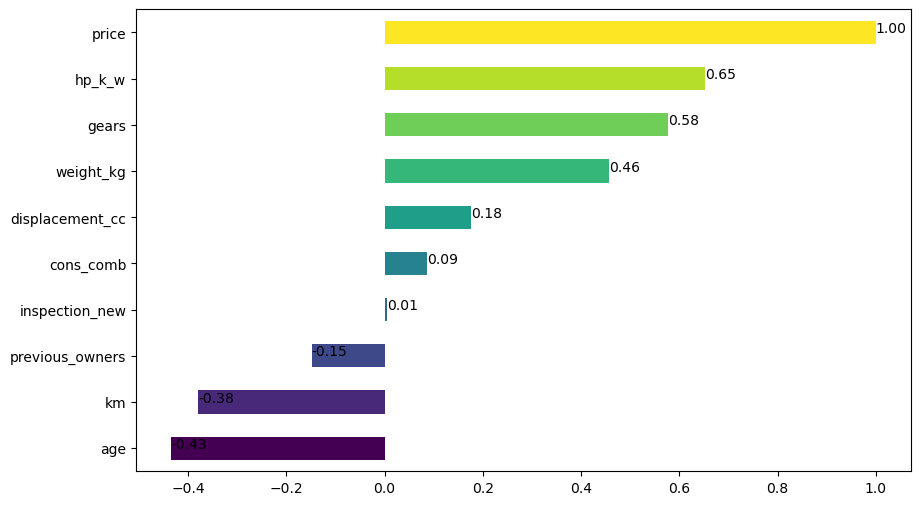

In [595]:
corr_values = numeric_df.corr()["price"].sort_values()
colors = plt.cm.viridis(np.linspace(0, 1, len(corr_values)))

ax = corr_values.plot.barh(color=colors)
for index, value in enumerate(corr_values):
    plt.text(value, index, "{:.2f}".format(value))

plt.show()

In [596]:
R2_score = corr**2 

In [597]:
def color_red(val):
    if val > 0.50 and val < 0.99:
        color = 'red'
    elif val>=1:
        color = "yellowgreen"
    else:
        color = 'white'
    return f'background-color: {color}'
pd.DataFrame.corr(R2_score).style.applymap(color_red)

,price,km,gears,age,previous_owners,hp_k_w,inspection_new,displacement_cc,weight_kg,cons_comb
price,1.000000,-0.069065,0.430269,-0.021857,-0.240992,0.510171,-0.279973,-0.172550,0.188880,-0.274991
km,-0.069065,1.000000,-0.306132,0.854545,-0.095028,-0.386751,-0.215116,-0.104290,-0.309073,-0.028450
gears,0.430269,-0.306132,1.000000,-0.306063,-0.219492,0.206952,-0.198355,-0.092763,0.016547,-0.214716
age,-0.021857,0.854545,-0.306063,1.000000,0.002898,-0.409276,-0.221710,-0.190459,-0.356330,-0.025896
previous_owners,-0.240992,-0.095028,-0.219492,0.002898,1.000000,-0.304573,-0.136334,-0.237573,-0.267311,-0.158260
hp_k_w,0.510171,-0.386751,0.206952,-0.409276,-0.304573,1.000000,-0.268894,0.318077,0.652822,-0.227103
inspection_new,-0.279973,-0.215116,-0.198355,-0.221710,-0.136334,-0.268894,1.000000,-0.218998,-0.233672,-0.094004
displacement_cc,-0.172550,-0.104290,-0.092763,-0.190459,-0.237573,0.318077,-0.218998,1.000000,0.382700,-0.226005
weight_kg,0.188880,-0.309073,0.016547,-0.356330,-0.267311,0.652822,-0.233672,0.382700,1.000000,-0.269098
cons_comb,-0.274991,-0.028450,-0.214716,-0.025896,-0.158260,-0.227103,-0.094004,-0.226005,-0.269098,1.000000


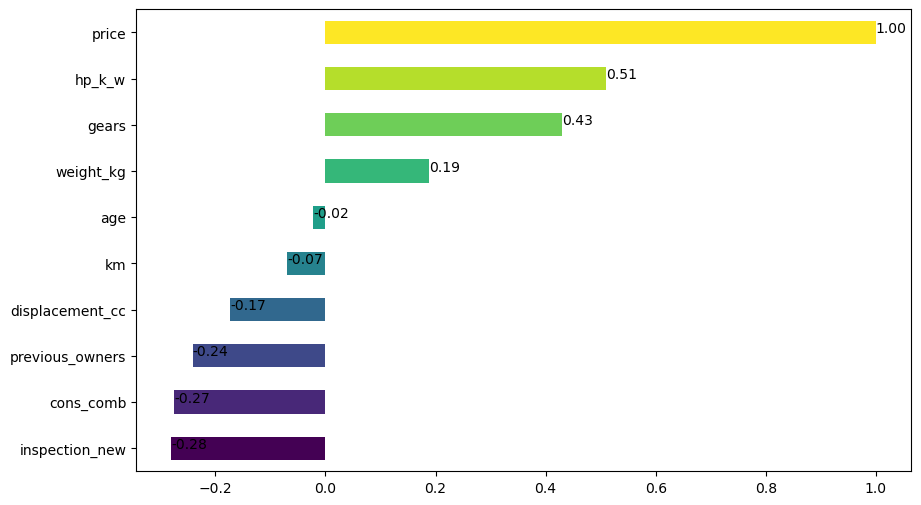

In [598]:
corr_values = pd.DataFrame.corr(R2_score)["price"].sort_values()
colors = plt.cm.viridis(np.linspace(0, 1, len(corr_values)))

ax = corr_values.plot.barh(color=colors)
for index, value in enumerate(corr_values):
    plt.text(value, index, "{:.2f}".format(value))

plt.show()

## "Conclusion in Exploratory Data Analysis (EDA)"

Since each of these values is close to +1, we can say that the distributions are slightly to moderately right-skewed. This may necessitate the application of some data transformations or normalization techniques during the data analysis and modeling process.

In [ ]:
!pip install summarytools

In [ ]:
from summarytools import dfSummary
dfSummary(df)

In [ ]:
!pip install ydata-profiling
    

In [ ]:
from ydata_profiling import ProfileReport

In [ ]:
pr_df = ProfileReport(df)
pr_df

 # <font color='green'> <b>Multiple Linear Regression Model</b><font color='black'>

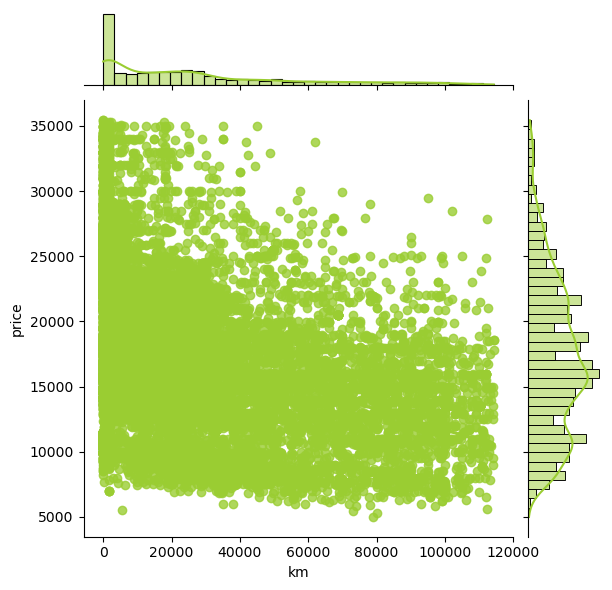

In [599]:
sns.jointplot(y=df["price"], x=df["km"],  kind='reg', color="yellowgreen" );

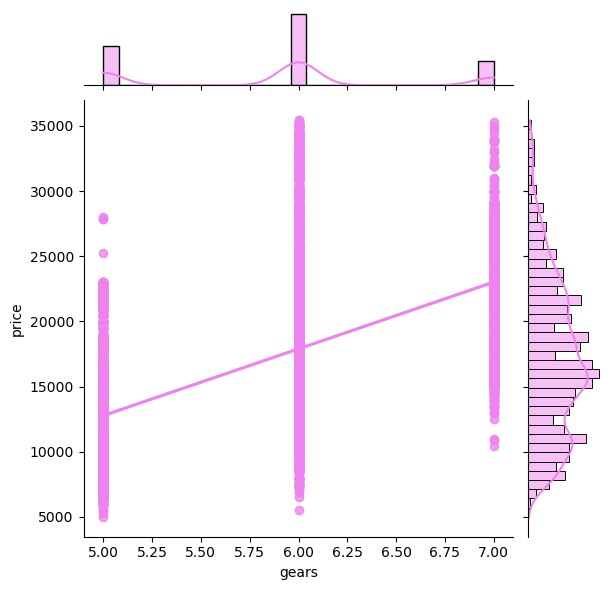

In [601]:
sns.jointplot(y=df["price"], x=df["gears"], kind='reg', color="violet");

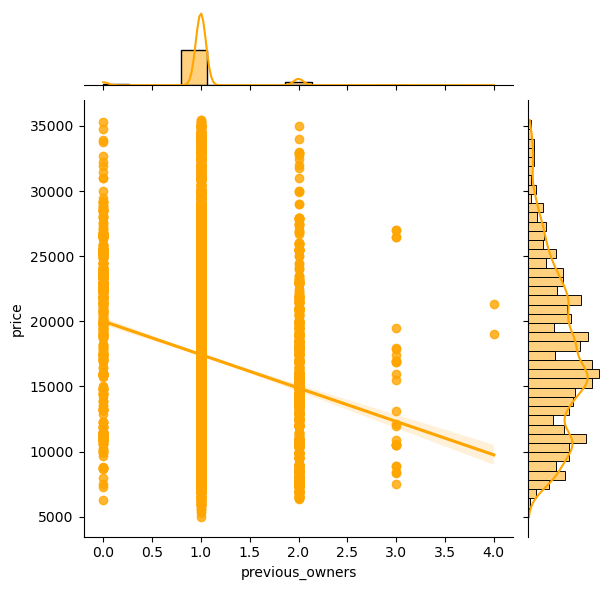

In [602]:
sns.jointplot(y=df["price"], x=df["previous_owners"],  kind='reg', color="orange");

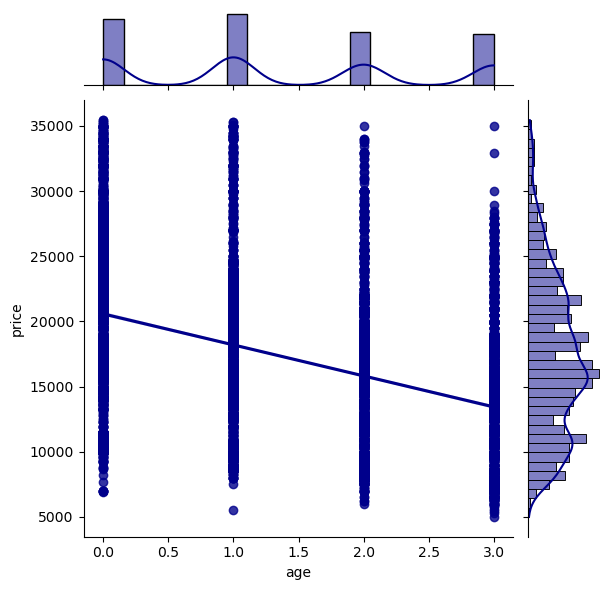

In [603]:
sns.jointplot(y=df["price"], x=df["age"],  kind='reg', color="darkblue");

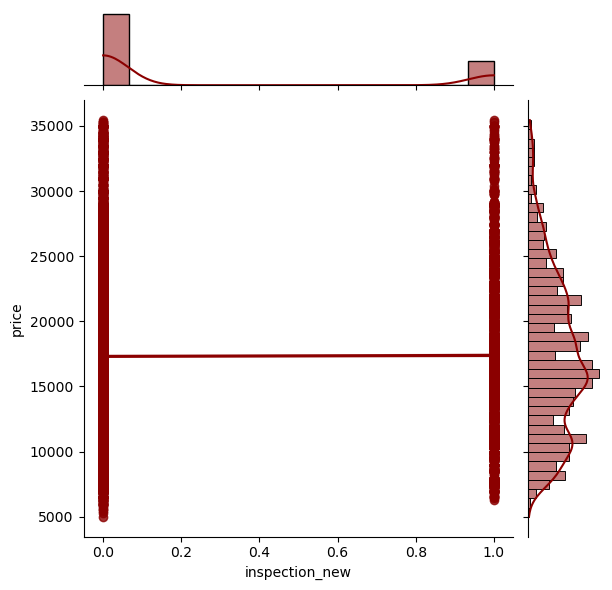

In [604]:
sns.jointplot(y=df["price"], x=df["inspection_new"],  kind='reg',  color="darkred");

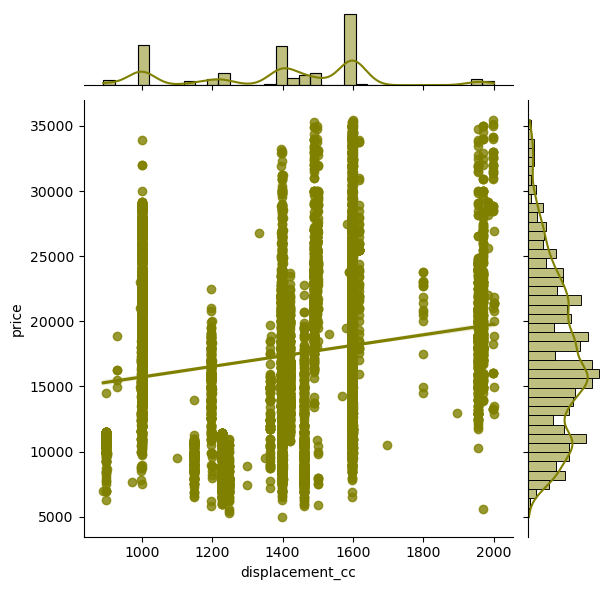

In [605]:
sns.jointplot(y=df["price"], x=df["displacement_cc"],  kind='reg', color="olive");

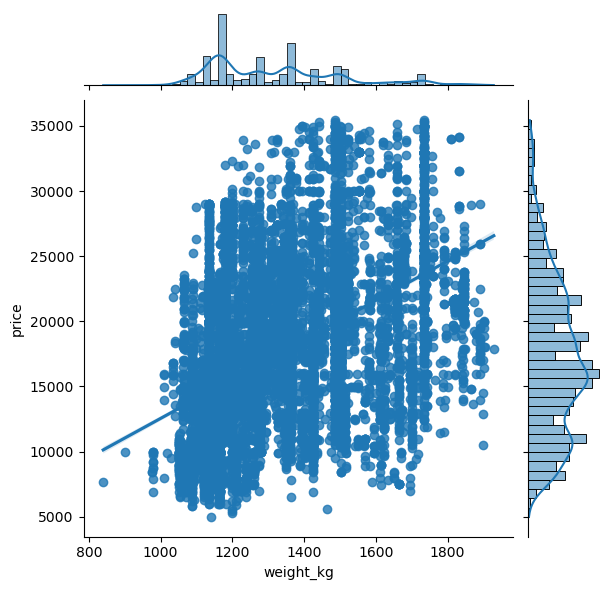

In [606]:
sns.jointplot(y=df["price"], x=df["weight_kg"],  kind='reg');

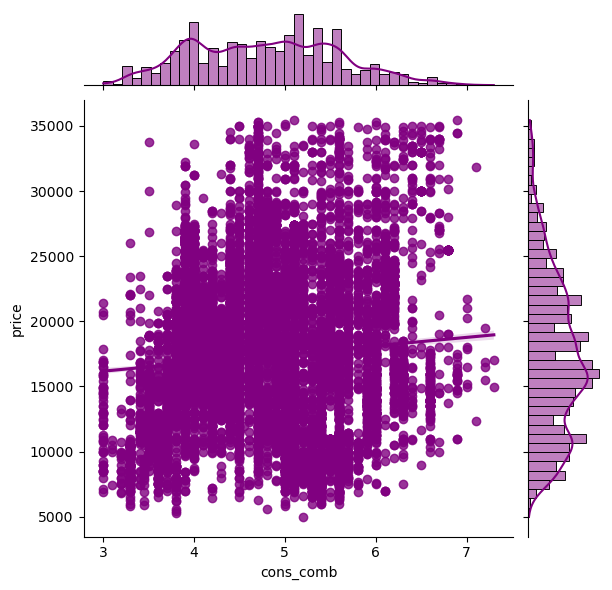

In [607]:
sns.jointplot(y=df["price"], x=df["cons_comb"],  kind='reg', color="purple");

In [608]:
numeric_df = df.select_dtypes(include=[np.number])
numeric_df

,price,km,gears,age,previous_owners,hp_k_w,inspection_new,displacement_cc,weight_kg,cons_comb
0,15770,56013.0,7.0,3.0,2.0,66.0,1,1422.0,1220.0,3.8
1,14500,80000.0,7.0,2.0,1.0,141.0,0,1798.0,1255.0,5.6
2,14640,83450.0,7.0,3.0,1.0,85.0,0,1598.0,1135.0,3.8
3,14500,73000.0,6.0,3.0,1.0,66.0,0,1422.0,1195.0,3.8
4,16790,16200.0,7.0,3.0,1.0,66.0,1,1422.0,1135.0,4.1
...,...,...,...,...,...,...,...,...,...,...
15786,33990,50.0,6.0,1.0,1.0,118.0,0,1598.0,1734.0,4.7
15787,33990,10803.0,6.0,1.0,1.0,118.0,0,1598.0,1734.0,4.6
15789,33990,1.0,6.0,1.0,1.0,118.0,0,1598.0,1734.0,4.7
15790,33975,15.0,6.0,0.0,1.0,146.0,1,1997.0,1734.0,5.3


## <font color='blue'> <b>Splitting the dataset into X(independent variables) and y (dependent variable)</b><font color='black'>

In [866]:
X = df[["inspection_new",
        "displacement_cc",
        "cons_comb",
        "previous_owners",
        "gears", 
        "weight_kg",
        "km",
        "hp_k_w",
        "age"
       ]]   
y = df["price"]
print(X,y)

       inspection_new  displacement_cc  cons_comb  previous_owners  gears  \
0                   1           1422.0        3.8              2.0    7.0   
1                   0           1798.0        5.6              1.0    7.0   
2                   0           1598.0        3.8              1.0    7.0   
3                   0           1422.0        3.8              1.0    6.0   
4                   1           1422.0        4.1              1.0    7.0   
...               ...              ...        ...              ...    ...   
15786               0           1598.0        4.7              1.0    6.0   
15787               0           1598.0        4.6              1.0    6.0   
15789               0           1598.0        4.7              1.0    6.0   
15790               1           1997.0        5.3              1.0    6.0   
15791               0           1598.0        4.7              1.0    6.0   

       weight_kg       km  hp_k_w  age  
0         1220.0  56013.0    66.0 

## <font color='blue'> <b>Multicollinearity</b><font color='black'>

In [867]:
def color_correlation1(val):
    """
    Takes a scalar and returns a string with
    the css property in a variety of color scales 
    for different correlations.
    """
    if val >= 0.6 and val < 0.99999 or val <= -0.6 and val > -0.99999:
        color = 'red'
    elif val < 0.6 and val >= 0.3 or val > -0.6 and val <= -0.3:
        color = 'blue'
    elif val == 1:
        color = 'green'    
    else:
        color = 'black'
    return 'color: %s' % color

numeric_df = df.select_dtypes(include=[np.number])
# Sayısal DataFrame üzerinde korelasyon hesapla ve stillendir
numeric_df.corr().style.applymap(color_correlation1)

,price,km,gears,age,previous_owners,hp_k_w,inspection_new,displacement_cc,weight_kg,cons_comb
price,1.000000,-0.379686,0.576557,-0.434147,-0.148580,0.651863,0.005432,0.175967,0.456522,0.086285
km,-0.379686,1.000000,-0.027012,0.789056,0.198694,0.063994,-0.043773,0.339046,0.174211,-0.296090
gears,0.576557,-0.027012,1.000000,-0.034307,-0.033462,0.443976,-0.029138,0.271554,0.310632,-0.104556
age,-0.434147,0.789056,-0.034307,1.000000,0.331902,-0.016137,-0.037801,0.261508,0.099767,-0.307217
previous_owners,-0.148580,0.198694,-0.033462,0.331902,1.000000,-0.003783,0.021076,0.045446,0.010216,-0.004940
hp_k_w,0.651863,0.063994,0.443976,-0.016137,-0.003783,1.000000,0.040319,0.535808,0.676739,0.224731
inspection_new,0.005432,-0.043773,-0.029138,-0.037801,0.021076,0.040319,1.000000,-0.038793,-0.050603,0.158956
displacement_cc,0.175967,0.339046,0.271554,0.261508,0.045446,0.535808,-0.038793,1.000000,0.537462,-0.094123
weight_kg,0.456522,0.174211,0.310632,0.099767,0.010216,0.676739,-0.050603,0.537462,1.000000,-0.008652
cons_comb,0.086285,-0.296090,-0.104556,-0.307217,-0.004940,0.224731,0.158956,-0.094123,-0.008652,1.000000


## <font color='blue'> <b>Train | Test Split</b><font color='black'>

In [868]:
from sklearn.model_selection import train_test_split

In [869]:
X_train, X_test, y_train, y_test = train_test_split(X,y, test_size=0.2, random_state=42)

In [870]:
print("X Train features shape: {}\ny Train features shape: {}\nX Test features shape : {}\nY Test features shape : {}".format
      (X_train.shape, y_train.shape, X_test.shape, y_test.shape))


X Train features shape: (11426, 9)
y Train features shape: (11426,)
X Test features shape : (2857, 9)
Y Test features shape : (2857,)


 # <font color='green'> <b>Multiple (Polynomial )Linear Regression Model</b><font color='black'>

In [871]:
from sklearn.preprocessing import PolynomialFeatures

In [872]:
print(X,y)

       inspection_new  displacement_cc  cons_comb  previous_owners  gears  \
0                   1           1422.0        3.8              2.0    7.0   
1                   0           1798.0        5.6              1.0    7.0   
2                   0           1598.0        3.8              1.0    7.0   
3                   0           1422.0        3.8              1.0    6.0   
4                   1           1422.0        4.1              1.0    7.0   
...               ...              ...        ...              ...    ...   
15786               0           1598.0        4.7              1.0    6.0   
15787               0           1598.0        4.6              1.0    6.0   
15789               0           1598.0        4.7              1.0    6.0   
15790               1           1997.0        5.3              1.0    6.0   
15791               0           1598.0        4.7              1.0    6.0   

       weight_kg       km  hp_k_w  age  
0         1220.0  56013.0    66.0 

In [873]:
poly_conv = PolynomialFeatures(degree=3, include_bias=False)

In [874]:
poly_conv.fit(X)

PolynomialFeatures(degree=3, include_bias=False)

In [875]:
poly_features = poly_conv.transform(X)  

In [876]:
poly_features.shape 

(14283, 219)

In [877]:
X.shape

(14283, 9)

In [878]:
X_train, X_test, y_train, y_test = train_test_split(poly_features, y, test_size=0.2, random_state=42)

## <font color='blue'> <b>Training the Model</b><font color='black'>

In [879]:
from sklearn.linear_model import LinearRegression

In [880]:
model_poly = LinearRegression()

In [881]:
model_poly.fit(X_train, y_train)

LinearRegression()

## <font color='blue'> <b>Predicting Test Data</b><font color='black'>

In [882]:
y_pred = model_poly.predict(X_test)

In [883]:
my_dict = {"Actual":y_test, "pred":y_pred, "residual": y_test - y_pred }
compare = pd.DataFrame(my_dict)
compare.head(20)

,Actual,pred,residual
9394,8989,11473.733512,-2484.733512
3398,22950,19136.529067,3813.470933
8076,18990,27402.005240,-8412.005240
9610,9690,9754.165263,-64.165263
173,17500,14311.386992,3188.613008
9795,9900,9370.250712,529.749288
11610,17300,18376.112083,-1076.112083
13998,8750,8997.405883,-247.405883
11769,16500,20437.384674,-3937.384674
8680,7450,11045.569800,-3595.569800


In [884]:
compare['residual'].sum()


143264.6147267484

In [885]:
df

,make_model,body_type,price,vat,km,type,fuel,gears,comfort_convenience,entertainment_media,extras,safety_security,age,previous_owners,hp_k_w,inspection_new,paint_type,upholstery_type,gearing_type,displacement_cc,weight_kg,drive_chain,cons_comb
0,Audi A1,Sedans,15770,VAT deductible,56013.0,Used,Diesel,7.0,"Air conditioning,Armrest,Automatic climate con...","Bluetooth,Hands-free equipment,On-board comput...","Alloy wheels,Catalytic Converter,Voice Control","ABS,Central door lock,Daytime running lights,D...",3.0,2.0,66.0,1,Metallic,Cloth,Automatic,1422.0,1220.0,front,3.8
1,Audi A1,Sedans,14500,Price negotiable,80000.0,Used,Benzine,7.0,"Air conditioning,Automatic climate control,Hil...","Bluetooth,Hands-free equipment,On-board comput...","Alloy wheels,Sport seats,Sport suspension,Voic...","ABS,Central door lock,Central door lock with r...",2.0,1.0,141.0,0,Metallic,Cloth,Automatic,1798.0,1255.0,front,5.6
2,Audi A1,Sedans,14640,VAT deductible,83450.0,Used,Diesel,7.0,"Air conditioning,Cruise control,Electrical sid...","MP3,On-board computer","Alloy wheels,Voice Control","ABS,Central door lock,Daytime running lights,D...",3.0,1.0,85.0,0,Metallic,Cloth,Automatic,1598.0,1135.0,front,3.8
3,Audi A1,Sedans,14500,VAT deductible,73000.0,Used,Diesel,6.0,"Air suspension,Armrest,Auxiliary heating,Elect...","Bluetooth,CD player,Hands-free equipment,MP3,O...","Alloy wheels,Sport seats,Voice Control","ABS,Alarm system,Central door lock with remote...",3.0,1.0,66.0,0,Metallic,Cloth,Automatic,1422.0,1195.0,front,3.8
4,Audi A1,Sedans,16790,VAT deductible,16200.0,Used,Diesel,7.0,"Air conditioning,Armrest,Automatic climate con...","Bluetooth,CD player,Hands-free equipment,MP3,O...","Alloy wheels,Sport package,Sport suspension,Vo...","ABS,Central door lock,Driver-side airbag,Elect...",3.0,1.0,66.0,1,Metallic,Cloth,Automatic,1422.0,1135.0,front,4.1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15786,Renault Espace,Van,33990,VAT deductible,50.0,Pre-registered,Benzine,6.0,"Air conditioning,Armrest,Automatic climate con...","Bluetooth,Digital radio,Hands-free equipment,M...","Alloy wheels,Touch screen","ABS,Blind spot monitor,Daytime running lights,...",1.0,1.0,118.0,0,Metallic,Part/Full Leather,Automatic,1598.0,1734.0,front,4.7
15787,Renault Espace,Van,33990,VAT deductible,10803.0,Used,Diesel,6.0,"Air conditioning,Armrest,Automatic climate con...","Bluetooth,Hands-free equipment,On-board comput...",Alloy wheels,"ABS,Blind spot monitor,Central door lock,Dayti...",1.0,1.0,118.0,0,Metallic,Part/Full Leather,Automatic,1598.0,1734.0,front,4.6
15789,Renault Espace,Van,33990,VAT deductible,1.0,Pre-registered,Diesel,6.0,"Air conditioning,Automatic climate control,Cru...","Bluetooth,Digital radio,Radio,USB","Alloy wheels,Touch screen","ABS,Blind spot monitor,Driver-side airbag,Elec...",1.0,1.0,118.0,0,Metallic,Part/Full Leather,Automatic,1598.0,1734.0,front,4.7
15790,Renault Espace,Van,33975,VAT deductible,15.0,Pre-registered,Diesel,6.0,"Air conditioning,Automatic climate control,Cru...","Bluetooth,Hands-free equipment,On-board comput...",Alloy wheels,"ABS,Adaptive Cruise Control,Blind spot monitor...",0.0,1.0,146.0,1,Metallic,Part/Full Leather,Automatic,1997.0,1734.0,front,5.3


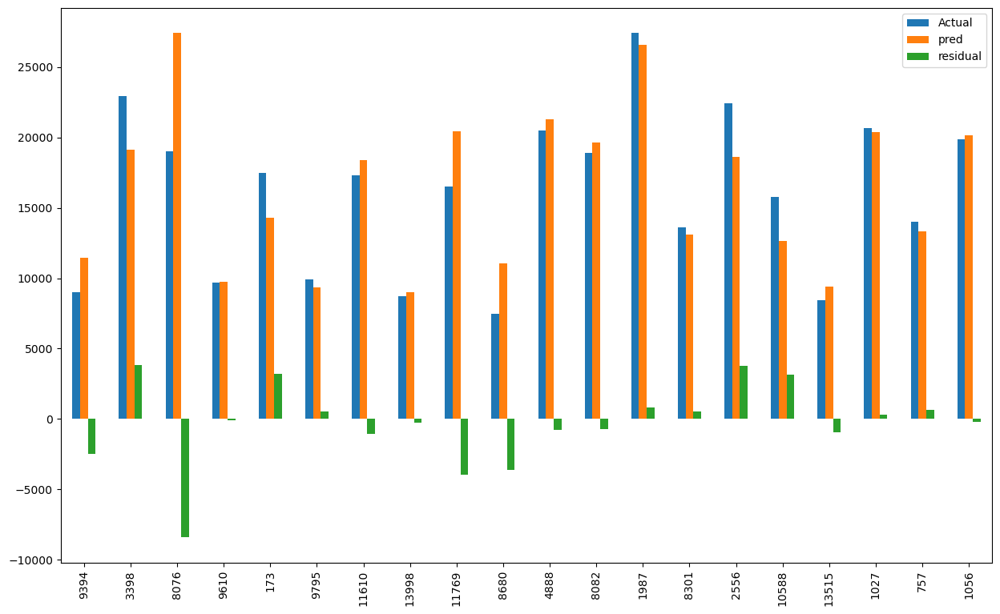

In [886]:
compare.head(20).plot(kind ="bar", figsize =(15,9))
plt.show();

## <font color='blue'> <b>Polynomial Coefficients </b><font color='black'>

In [887]:
model_poly.coef_

array([-2.60316169e+01,  7.24890430e+01, -4.87634580e+00,  2.02120283e+00,
        1.58192941e+00, -1.50447821e+02, -9.45059899e-01,  2.52939946e+01,
       -1.76919437e-01, -5.90655502e-01,  7.11695855e+00, -1.39332502e+01,
       -3.54244185e+01,  3.91409653e-01,  6.20946752e+00, -3.37638321e-02,
       -1.75081727e+02,  5.54153346e+00, -1.05991243e-01, -2.87456805e+01,
        2.77345833e+00, -2.38626518e+01,  9.86048729e-02,  4.86498694e-04,
        2.75549432e+00, -1.81577331e-01, -4.15733000e+01,  6.53023835e+00,
       -2.77679760e+01,  2.80534579e+01,  1.94647003e-01, -1.00940268e+02,
        2.10289736e+01,  4.17237207e+00,  3.09931743e+01, -2.31184007e+01,
        1.12287550e-02,  3.35175136e+02,  9.67151387e-01,  1.06281378e+01,
       -1.21367887e+00,  4.63033476e-02,  1.59397293e+02, -1.05684222e+01,
        4.08446920e-02,  3.39184206e-05, -1.09671972e+00,  1.52722538e+01,
       -9.96874949e-09, -3.91062409e-03,  1.03487249e-01, -1.10664317e+01,
       -2.28276522e+02, -

## <font color='blue'> <b>Evaluation on the Test Set</b><font color='black'> 

In [888]:
from sklearn.metrics import mean_absolute_error,mean_squared_error,r2_score

In [889]:
y_pred = model_poly.predict(X_test)

In [890]:

def eval_metric(actual, pred):
    mae = mean_absolute_error(actual, pred)
    mse = mean_squared_error(actual, pred)
    rmse = np.sqrt(mean_squared_error(actual, pred))
    R2_score = r2_score(actual, pred)
    print("Model testing performance: ")
    print("---------------------------")
    print(f"R2_score \t: {R2_score}")
    print(f"MAE \t\t: {mae}")
    print(f"MSE \t\t: {mse}")
    print(f"RMSE \t\t: {rmse}")

In [891]:
eval_metric(y_test, y_pred) 

Model testing performance: 
---------------------------
R2_score 	: 0.8459440846373384
MAE 		: 1806.1374937765213
MSE 		: 5693966.370411797
RMSE 		: 2386.203338027126


In [892]:
y_train_pred = model_poly.predict(X_train)  

In [893]:
eval_metric(y_train, y_train_pred) 

Model testing performance: 
---------------------------
R2_score 	: 0.8523500559851442
MAE 		: 1733.1809432506598
MSE 		: 5311398.005708887
RMSE 		: 2304.647045798746


In [894]:
def poly(d):   # degree derecesi içine ne yazarsam ona göre çözüm oluşturacak
    
    train_rmse_errors = []   # trains rmse değerlerin toplayacak
    test_rmse_errors = []    # test rmse değerlerin toplayacak
    number_of_features = []  # derece arttıkça feature sayısının kaça çıktığnı göreceğiz
    
    for i in range(1, d):  # 1 den kaçıncı dereceye kadar istiyorsak ona göre yazacağız
        polynomial_converter = PolynomialFeatures(degree = i, include_bias =False)
        poly_features = polynomial_converter.fit_transform(X)
        
        X_train, X_test, y_train, y_test = train_test_split(poly_features, y, test_size=0.3, random_state=101)
        
        model = LinearRegression(fit_intercept=True) 
        model.fit(X_train, y_train)
        
        train_pred = model.predict(X_train)
        test_pred = model.predict(X_test)
        
        train_RMSE = np.sqrt(mean_squared_error(y_train,train_pred))
        test_RMSE = np.sqrt(mean_squared_error(y_test,test_pred))
        
        train_rmse_errors.append(train_RMSE)
        test_rmse_errors.append(test_RMSE)
        
        number_of_features.append(poly_features.shape[1])
        
    return pd.DataFrame({"train_rmse_errors": train_rmse_errors, "test_rmse_errors":test_rmse_errors, "number of features":number_of_features}, 
                        index=range(1,d))

In [656]:
poly(8)

,train_rmse_errors,test_rmse_errors,number of features
1,3000.516501,2967.959204,9
2,2576.442880,2599.476458,54
3,2305.616788,2375.123364,219
4,2270.921959,2403.416425,714
5,2524.380120,2704.448802,2001
6,3144.476689,3659.267156,5004
7,5504.923689,7708.218846,11439


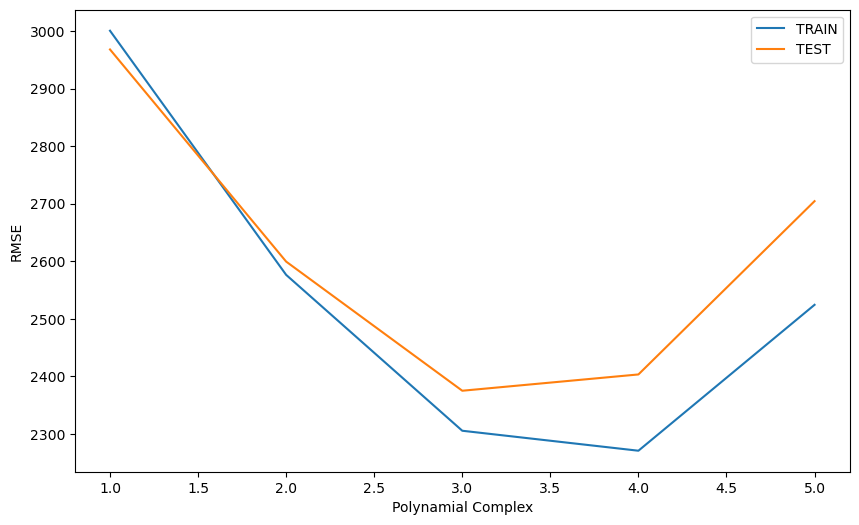

In [658]:

plt.plot(range(1,6), poly(6)["train_rmse_errors"], label = "TRAIN")
plt.plot(range(1,6), poly(6)["test_rmse_errors"], label = "TEST")
plt.xlabel("Polynamial Complex")
plt.ylabel("RMSE")
plt.legend();
plt.show()

## <font color='blue'> <b> Scaling the Data</b><font color='black'> 

In [659]:
from sklearn.preprocessing import StandardScaler, MinMaxScaler, RobustScaler

In [660]:
scaler = StandardScaler()

In [661]:
scaler.fit(X_train)

StandardScaler()

In [662]:
X_train_scaled = scaler.transform(X_train)
X_train_scaled

array([[-0.57957358,  0.01502233,  1.5262135 , ..., -0.96743426,
        -0.85949981, -0.74409982],
       [-0.57957358, -1.50665477, -0.7291396 , ..., -0.51006525,
        -0.62659664, -0.64784073],
       [ 1.72540647,  2.17960801, -0.47854481, ...,  2.42083006,
         2.4344164 ,  1.85489574],
       ...,
       [-0.57957358,  0.39163742,  0.89972653, ..., -0.96743426,
        -0.85949981, -0.74409982],
       [-0.57957358,  0.10251877, -0.7291396 , ..., -0.54842824,
        -0.63657821, -0.64784073],
       [-0.57957358,  0.01502233,  1.02502392, ..., -0.96743426,
        -0.85949981, -0.74409982]])

In [663]:
X_test_scaled = scaler.transform(X_test)
X_test_scaled

array([[ 1.72540647,  0.01121814,  0.52383435, ..., -0.15425082,
         0.01887785,  0.02597294],
       [-0.57957358,  2.17960801, -0.35324742, ...,  2.42083006,
         2.4344164 ,  1.85489574],
       [ 1.72540647,  0.77205669,  2.52859266, ..., -0.96743426,
        -0.85949981, -0.74409982],
       ...,
       [-0.57957358,  0.25088228, -1.85681615, ..., -0.40272354,
        -0.12751843,  0.02597294],
       [-0.57957358,  0.01502233,  0.14794216, ..., -0.1773993 ,
        -0.55339851, -0.64784073],
       [ 1.72540647,  0.77205669, -1.73151875, ...,  0.25738129,
         0.21850913,  0.02597294]])

In [664]:
pd.DataFrame(X_train_scaled).agg(["mean", "std"]).round()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,...,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218
mean,0.0,0.0,-0.0,0.0,0.0,-0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-0.0,-0.0,0.0,0.0,0.0,-0.0,0.0,0.0,-0.0,-0.0,0.0,-0.0,-0.0,-0.0,-0.0,0.0,-0.0,-0.0,0.0,0.0,-0.0,0.0,0.0,0.0,0.0,0.0,-0.0,0.0,-0.0,-0.0,0.0,-0.0,0.0,-0.0,0.0,-0.0,0.0,...,0.0,0.0,-0.0,-0.0,0.0,0.0,0.0,0.0,-0.0,-0.0,0.0,-0.0,-0.0,-0.0,-0.0,0.0,-0.0,-0.0,0.0,-0.0,0.0,0.0,0.0,0.0,-0.0,0.0,0.0,0.0,-0.0,-0.0,0.0,-0.0,0.0,0.0,-0.0,0.0,0.0,0.0,0.0,0.0,-0.0,-0.0,-0.0,-0.0,-0.0,-0.0,-0.0,0.0,0.0,-0.0
std,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,...,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0


In [665]:
pd.DataFrame(X_test_scaled).agg(["mean", "std"]).round().T

,mean,std
0,-0.0,1.0
1,-0.0,1.0
2,-0.0,1.0
3,-0.0,1.0
4,0.0,1.0
...,...,...
214,0.0,1.0
215,0.0,1.0
216,-0.0,1.0
217,-0.0,1.0


In [448]:
#normscaler = MinMaxScaler()

In [449]:
#normscaler.fit(X_train)

In [450]:
#X_train_normscaled = normscaler.transform(X_train)
#X_train_normscaled

In [451]:
#X_test_normscaled = normscaler.transform(X_test)
#X_test_normscaled

In [452]:
#pd.DataFrame(X_train_normscaled).agg(["mean", "std"]).round()

In [453]:
#pd.DataFrame(X_test_normscaled).agg(["mean", "std"]).round()

# <font color='green'> <b> Linear Regression Model</b><font color='black'>

In [666]:
from sklearn.linear_model import LinearRegression

In [667]:
lm = LinearRegression()

In [668]:
lm.fit(X_train_scaled, y_train)

LinearRegression()

In [669]:
y_pred = lm.predict(X_test_scaled)
y_train_pred = lm.predict(X_train_scaled)

In [670]:
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

def train_val(y_train, y_train_pred, y_test, y_pred, i): 
    
    scores = {i+"_train": {"R2" : r2_score(y_train, y_train_pred),
    "mae" : mean_absolute_error(y_train, y_train_pred),
    "mse" : mean_squared_error(y_train, y_train_pred),                          
    "rmse" : np.sqrt(mean_squared_error(y_train, y_train_pred))},
    
    i+"_test": {"R2" : r2_score(y_test, y_pred),
    "mae" : mean_absolute_error(y_test, y_pred),
    "mse" : mean_squared_error(y_test, y_pred),
    "rmse" : np.sqrt(mean_squared_error(y_test, y_pred))}}
    
    return pd.DataFrame(scores)

In [671]:
plm = train_val(y_train, y_train_pred, y_test, y_pred, "linear") 
plm 

,linear_train,linear_test
R2,8.566918e-01,8.501178e-01
mae,1.699781e+03,1.780390e+03
mse,5.155212e+06,5.539705e+06
rmse,2.270509e+03,2.353658e+03


In [672]:
def convert_and_round_df(df):
    for column in df.columns:
        try:
            df[column] = df[column].apply(lambda x: round(float(x), 2))
        except:
            continue
    return df

df = convert_and_round_df(plm)
df


,linear_train,linear_test
R2,0.86,0.85
mae,1699.78,1780.39
mse,5155211.90,5539705.03
rmse,2270.51,2353.66


## <font color='blue'> <b> Multicolinearty</b><font color='black'> 

In [673]:
def color_red(val):
   
    if val > 0.90 and val < 0.99:
        color = 'red'
    elif val>=1:
        color = "blue"
    else:
        color = 'black'
    return f'color: {color}'

In [686]:
pd.DataFrame(poly_features).corr().style.applymap(color_red)

In [687]:
def color_red(val):
    if val > 0.90 and val < 0.99:
        color = 'red'
    elif val>=1:
        color = "blue"
    else:
        color = 'white'
    return f'background-color: {color}'
pd.DataFrame(poly_features).corr().style.applymap(color_red)

## <font color='blue'> <b>Cross Validate</b><font color='black'>

In [676]:
from sklearn.model_selection import cross_validate, cross_val_score

In [677]:
import sklearn.metrics
for i in dir(sklearn.metrics):
    print(i)

ConfusionMatrixDisplay
DetCurveDisplay
DistanceMetric
PrecisionRecallDisplay
PredictionErrorDisplay
RocCurveDisplay
SCORERS
__all__
__builtins__
__cached__
__doc__
__file__
__loader__
__name__
__package__
__path__
__spec__
_base
_classification
_dist_metrics
_pairwise_distances_reduction
_pairwise_fast
_plot
_ranking
_regression
_scorer
accuracy_score
adjusted_mutual_info_score
adjusted_rand_score
auc
average_precision_score
balanced_accuracy_score
brier_score_loss
calinski_harabasz_score
check_scoring
class_likelihood_ratios
classification_report
cluster
cohen_kappa_score
completeness_score
confusion_matrix
consensus_score
coverage_error
d2_absolute_error_score
d2_pinball_score
d2_tweedie_score
davies_bouldin_score
dcg_score
det_curve
euclidean_distances
explained_variance_score
f1_score
fbeta_score
fowlkes_mallows_score
get_scorer
get_scorer_names
hamming_loss
hinge_loss
homogeneity_completeness_v_measure
homogeneity_score
jaccard_score
label_ranking_average_precision_score
label_ran

In [678]:
model = LinearRegression()
scores = cross_validate(model, X_train_scaled, y_train, scoring =['r2',
                                                                  'neg_mean_absolute_error',
                                                                  'neg_mean_squared_error',
                                                                  'neg_root_mean_squared_error',], cv = 5)

In [679]:
pd.DataFrame(scores, index = range(1,6))

,fit_time,score_time,test_r2,test_neg_mean_absolute_error,test_neg_mean_squared_error,test_neg_root_mean_squared_error
1,13.185440,0.008416,0.843152,-1784.668427,-5.824785e+06,-2413.459111
2,7.429640,0.008466,0.848505,-1693.197251,-5.335892e+06,-2309.955024
3,7.182579,0.008559,0.844179,-1750.393268,-5.484819e+06,-2341.968952
4,6.832132,0.007772,0.853383,-1731.289426,-5.260107e+06,-2293.492394
5,7.073366,0.007956,0.844749,-1753.964183,-5.641904e+06,-2375.269165


In [680]:
cv_df = pd.DataFrame(scores, index=range(1, 6)).add_prefix("cv_")
cv_df

,cv_fit_time,cv_score_time,cv_test_r2,cv_test_neg_mean_absolute_error,cv_test_neg_mean_squared_error,cv_test_neg_root_mean_squared_error
1,13.185440,0.008416,0.843152,-1784.668427,-5.824785e+06,-2413.459111
2,7.429640,0.008466,0.848505,-1693.197251,-5.335892e+06,-2309.955024
3,7.182579,0.008559,0.844179,-1750.393268,-5.484819e+06,-2341.968952
4,6.832132,0.007772,0.853383,-1731.289426,-5.260107e+06,-2293.492394
5,7.073366,0.007956,0.844749,-1753.964183,-5.641904e+06,-2375.269165


In [681]:
cv_df= cv_df.iloc[:, 2:].mean()
cv_df


cv_test_r2                             8.467935e-01
cv_test_neg_mean_absolute_error       -1.742703e+03
cv_test_neg_mean_squared_error        -5.509501e+06
cv_test_neg_root_mean_squared_error   -2.346829e+03
dtype: float64

In [682]:
def convert_and_round_df(df):
    for column in df.columns:
        try:
            df[column] = df[column].apply(lambda x: round(float(x), 2))
        except:
            continue
    return df



In [683]:
a=train_val(y_train, y_train_pred, y_test, y_pred, "linear")
a= convert_and_round_df(a)
a

,linear_train,linear_test
R2,0.86,0.85
mae,1699.78,1780.39
mse,5155211.90,5539705.03
rmse,2270.51,2353.66


In [684]:

lm.coef_

array([ 3.71279462e+03, -3.50286612e+04, -4.56907118e+04, -8.63993930e+03,
       -4.40150539e+04, -8.81049121e+04, -2.25238337e+04,  7.75828085e+04,
        5.58017002e+03,  3.71279462e+03,  3.65030440e+03, -1.21509191e+03,
       -2.91776913e+02, -9.86540329e+03,  8.79322007e+02,  3.71721238e+02,
       -3.50224519e+03, -1.10561806e+03, -5.13397323e+04,  4.32526795e+03,
        5.75116172e+03,  3.27170631e+04,  8.76522340e+04,  2.12247143e+04,
        5.63842510e+04, -7.72301396e+02, -5.62378203e+04,  1.89288425e+04,
        8.53765134e+04,  1.17383521e+05,  1.01888826e+04, -6.62095560e+04,
       -2.91610577e+03,  3.01733022e+03,  1.54697499e+03, -1.18544462e+04,
        4.44075240e+03,  5.30662334e+03, -4.41159337e+03, -9.20789635e+03,
        7.59931726e+04,  1.82690090e+03, -5.09574494e+04, -3.49460487e+03,
        5.22194747e+04,  9.46508674e+03, -1.18423210e+05,  1.98343059e+04,
        1.43980101e+03, -6.02037588e+03,  2.39164700e+03, -4.98778847e+03,
       -2.25119886e+04,  

In [685]:
lm_df = pd.DataFrame(lm.coef_, columns = ["lm_coef"])
lm_df

,lm_coef
0,3712.794624
1,-35028.661185
2,-45690.711840
3,-8639.939305
4,-44015.053872
...,...
214,-151.794917
215,-1203.632631
216,1303.695484
217,6477.231470


## <font color='blue'> <b>Choosing best alpha value with Cross Validation (CV) (Rigde)</b><font color='black'>

In [688]:
from sklearn.linear_model import Ridge

In [689]:
from sklearn.linear_model import RidgeCV

In [698]:
alpha_space = np.linspace(0.01, 0.02, 100)
alpha_space


array([0.01      , 0.01010101, 0.01020202, 0.01030303, 0.01040404,
       0.01050505, 0.01060606, 0.01070707, 0.01080808, 0.01090909,
       0.0110101 , 0.01111111, 0.01121212, 0.01131313, 0.01141414,
       0.01151515, 0.01161616, 0.01171717, 0.01181818, 0.01191919,
       0.0120202 , 0.01212121, 0.01222222, 0.01232323, 0.01242424,
       0.01252525, 0.01262626, 0.01272727, 0.01282828, 0.01292929,
       0.0130303 , 0.01313131, 0.01323232, 0.01333333, 0.01343434,
       0.01353535, 0.01363636, 0.01373737, 0.01383838, 0.01393939,
       0.0140404 , 0.01414141, 0.01424242, 0.01434343, 0.01444444,
       0.01454545, 0.01464646, 0.01474747, 0.01484848, 0.01494949,
       0.01505051, 0.01515152, 0.01525253, 0.01535354, 0.01545455,
       0.01555556, 0.01565657, 0.01575758, 0.01585859, 0.0159596 ,
       0.01606061, 0.01616162, 0.01626263, 0.01636364, 0.01646465,
       0.01656566, 0.01666667, 0.01676768, 0.01686869, 0.0169697 ,
       0.01707071, 0.01717172, 0.01727273, 0.01737374, 0.01747

In [699]:
ridge_cv_model = RidgeCV(alphas = alpha_space, cv= 5, scoring = "neg_root_mean_squared_error")

In [700]:
ridge_cv_model.fit(X_train_scaled, y_train)

RidgeCV(alphas=array([0.01      , 0.01010101, 0.01020202, 0.01030303, 0.01040404,
       0.01050505, 0.01060606, 0.01070707, 0.01080808, 0.01090909,
       0.0110101 , 0.01111111, 0.01121212, 0.01131313, 0.01141414,
       0.01151515, 0.01161616, 0.01171717, 0.01181818, 0.01191919,
       0.0120202 , 0.01212121, 0.01222222, 0.01232323, 0.01242424,
       0.01252525, 0.01262626, 0.01272727, 0.01282828, 0.01292929,
       0.0130...
       0.01707071, 0.01717172, 0.01727273, 0.01737374, 0.01747475,
       0.01757576, 0.01767677, 0.01777778, 0.01787879, 0.0179798 ,
       0.01808081, 0.01818182, 0.01828283, 0.01838384, 0.01848485,
       0.01858586, 0.01868687, 0.01878788, 0.01888889, 0.0189899 ,
       0.01909091, 0.01919192, 0.01929293, 0.01939394, 0.01949495,
       0.01959596, 0.01969697, 0.01979798, 0.01989899, 0.02      ]),
        cv=5, scoring='neg_root_mean_squared_error')

In [701]:
ridge_cv_model.alpha_

0.011717171717171718

In [707]:
ridge_cv_model.best_score_

-2346.16523919719

In [709]:
y_pred = ridge_cv_model.predict(X_test_scaled)
y_train_pred = ridge_cv_model.predict(X_train_scaled)

In [710]:
rcs =  convert_and_round_df(train_val(y_train, y_train_pred, y_test, y_pred, "rigde_cv"))
rcs

,rigde_cv_train,rigde_cv_test
R2,0.86,0.85
mae,1708.66,1787.73
mse,5180030.92,5569018.12
rmse,2275.97,2359.88


In [711]:
convert_and_round_df(pd.concat([ rcs], axis = 1))

,rigde_cv_train,rigde_cv_test
R2,0.86,0.85
mae,1708.66,1787.73
mse,5180030.92,5569018.12
rmse,2275.97,2359.88


In [712]:
ridge_cv_model.coef_

array([ 3.83660182e+03, -2.95961703e+04, -1.26505296e+04, -5.49804613e+03,
       -2.32027938e+04, -4.89398158e+04, -1.97669255e+04,  3.22377882e+04,
        6.07085595e+03,  3.83660182e+03,  3.53696264e+03, -1.57151588e+03,
       -3.13765190e+02, -8.74500993e+03, -5.29008568e+01,  3.66444939e+02,
       -3.59892575e+03, -1.06341781e+03, -2.59479756e+04,  8.17866903e+03,
        5.84604438e+03,  1.27601302e+04,  6.30374516e+04,  1.84531834e+04,
        4.00352893e+04, -2.57816929e+03, -6.13471144e+04,  1.59697409e+04,
        3.57973741e+04,  6.48337916e+04,  8.20319498e+03, -2.22198137e+04,
       -1.78468512e+03,  2.82332433e+03, -7.44723259e+02, -1.41781907e+04,
        3.08167899e+03,  6.17972473e+03, -3.73873052e+03, -5.35551301e+03,
        3.14706376e+04, -4.56039256e+02, -1.53300580e+03, -5.06632113e+03,
        2.51903716e+04,  1.05002173e+04, -5.36298372e+04,  1.57062855e+04,
        1.18558247e+03, -4.62734102e+03,  3.05145661e+03, -2.20891381e+04,
       -1.80096970e+04,  

In [713]:
rcm_df = pd.DataFrame(ridge_cv_model.coef_, columns = ["ridge_cv_model.coef_0.02"])

In [714]:
convert_and_round_df(pd.concat([lm_df, rcm_df], axis = 1))

,lm_coef,ridge_cv_model.coef_0.02
0,3712.79,3836.60
1,-35028.66,-29596.17
2,-45690.71,-12650.53
3,-8639.94,-5498.05
4,-44015.05,-23202.79
...,...,...
214,-151.79,-292.45
215,-1203.63,-1414.54
216,1303.70,3076.54
217,6477.23,6281.41


 # <font color='blue'> <b>Lasso</b><font color='black'>

In [764]:
from sklearn.linear_model import Lasso, LassoCV

In [784]:
lasso_model = Lasso(alpha=0.01, random_state = 42)
lasso_model.fit(X_train_scaled, y_train)

Lasso(alpha=0.01, random_state=42)

In [785]:
y_pred = lasso_model.predict(X_test_scaled)
y_train_pred = lasso_model.predict(X_train_scaled)

In [786]:
lss = convert_and_round_df(train_val(y_train, y_train_pred, y_test, y_pred, "lasso"))
lss

,lasso_train,lasso_test
R2,0.83,0.82
mae,1929.84,1995.74
mse,6284941.29,6631303.73
rmse,2506.98,2575.13


In [787]:
convert_and_round_df(pd.concat([ rcs, lss], axis = 1))

,rigde_cv_train,rigde_cv_test,lasso_train,lasso_test
R2,0.86,0.85,0.83,0.82
mae,1708.66,1787.73,1929.84,1995.74
mse,5180030.92,5569018.12,6284941.29,6631303.73
rmse,2275.97,2359.88,2506.98,2575.13


In [788]:
model = Lasso(alpha=1.0, random_state = 42)
scores = cross_validate(model, X_train_scaled, y_train, scoring =['r2',
                                                                  'neg_mean_absolute_error',
                                                                  'neg_mean_squared_error',
                                                                  'neg_root_mean_squared_error',], cv = 5)

In [789]:
pd.DataFrame(scores, index = range(1,6))

,fit_time,score_time,test_r2,test_neg_mean_absolute_error,test_neg_mean_squared_error,test_neg_root_mean_squared_error
1,26.813640,0.005251,0.815279,-2006.132137,-6.859893e+06,-2619.139761
2,27.676776,0.000000,0.828274,-1900.701662,-6.048477e+06,-2459.365154
3,26.690056,0.002090,0.816724,-1954.412038,-6.451214e+06,-2539.924066
4,27.585738,0.004243,0.821134,-1984.455184,-6.417069e+06,-2533.193420
5,26.997770,0.004117,0.822389,-1932.698301,-6.454469e+06,-2540.564695


In [797]:
scores = convert_and_round_df(pd.DataFrame(scores, index = range(1,6)))
scores.iloc[:,2:].mean()

test_r2                                   0.822
test_neg_mean_absolute_error          -1955.680
test_neg_mean_squared_error        -6446224.438
test_neg_root_mean_squared_error      -2538.436
dtype: float64

<Axes: >

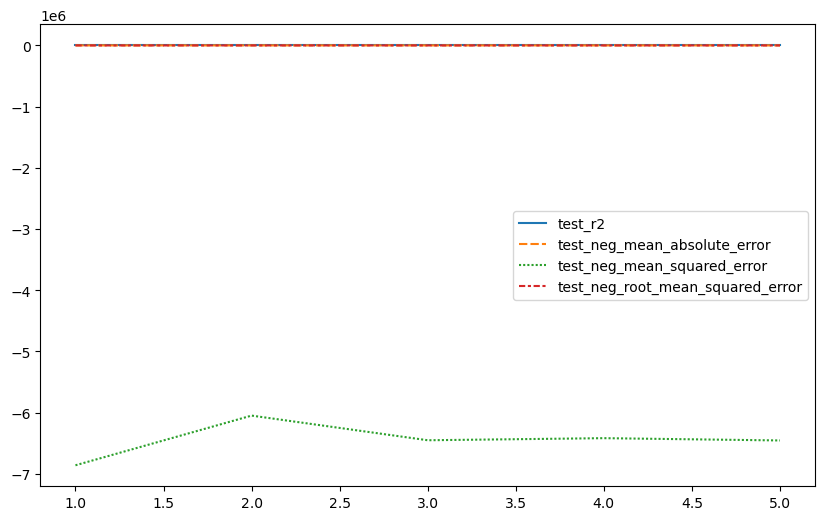

In [798]:
sns.lineplot(data=scores.iloc[:,2:])

In [799]:
lasso_model.coef_

array([ 1.49360006e+03, -2.40886286e+03, -4.59783827e+02,  1.37274552e+03,
       -6.35403137e+03,  8.35003758e+02,  6.14382229e+02,  6.07964102e+03,
        7.93463748e+02, -3.59951890e+02,  1.23795222e+02, -1.93364713e+03,
        9.85547327e+02,  6.27720754e+02, -2.53615343e+01, -1.46470721e+03,
        5.33563457e+02, -3.85806324e+02, -6.87534502e+02,  8.08213131e+02,
       -1.60942250e+03, -1.21274349e+03,  5.15066869e+02,  5.71563798e+01,
       -1.80858684e+03, -1.40931815e+02, -4.32661152e+03,  1.09327880e+03,
        2.03455897e+03, -6.10311065e+02,  6.40661237e+02,  6.19450152e+02,
        8.05992409e+02, -1.12082018e+03, -9.03285998e+02, -1.51413011e+03,
       -1.43836359e+03,  1.32307731e+03,  7.32982689e+02,  3.36682866e+03,
       -2.54456993e+03, -1.53249943e+03, -5.06423242e+01, -9.13918019e+02,
       -8.59920298e+02,  2.41274958e+02,  2.45298798e+03, -1.15597275e+02,
       -5.35730764e+02, -1.46847540e+03,  1.00115064e+03, -8.90888867e+02,
       -1.61355126e+03,  

In [800]:
lsm_df = pd.DataFrame(lasso_model.coef_, columns = ["losso_coef_alpha_1"])

In [801]:
convert_and_round_df(pd.concat([lm_df, rcm_df, lsm_df], axis=1))

,lm_coef,ridge_cv_model.coef_0.02,losso_coef_alpha_1
0,3712.79,3836.60,1493.60
1,-35028.66,-29596.17,-2408.86
2,-45690.71,-12650.53,-459.78
3,-8639.94,-5498.05,1372.75
4,-44015.05,-23202.79,-6354.03
...,...,...,...
214,-151.79,-292.45,-415.12
215,-1203.63,-1414.54,233.82
216,1303.70,3076.54,1039.15
217,6477.23,6281.41,1817.64


## <font color='blue'> <b>Choosing best alpha value with Cross Validation (CV) (Lasso)</b><font color='black'> 

In [795]:
alpha_space = np.linspace(0.01, 0.1, 100)
alpha_space

array([0.01      , 0.01090909, 0.01181818, 0.01272727, 0.01363636,
       0.01454545, 0.01545455, 0.01636364, 0.01727273, 0.01818182,
       0.01909091, 0.02      , 0.02090909, 0.02181818, 0.02272727,
       0.02363636, 0.02454545, 0.02545455, 0.02636364, 0.02727273,
       0.02818182, 0.02909091, 0.03      , 0.03090909, 0.03181818,
       0.03272727, 0.03363636, 0.03454545, 0.03545455, 0.03636364,
       0.03727273, 0.03818182, 0.03909091, 0.04      , 0.04090909,
       0.04181818, 0.04272727, 0.04363636, 0.04454545, 0.04545455,
       0.04636364, 0.04727273, 0.04818182, 0.04909091, 0.05      ,
       0.05090909, 0.05181818, 0.05272727, 0.05363636, 0.05454545,
       0.05545455, 0.05636364, 0.05727273, 0.05818182, 0.05909091,
       0.06      , 0.06090909, 0.06181818, 0.06272727, 0.06363636,
       0.06454545, 0.06545455, 0.06636364, 0.06727273, 0.06818182,
       0.06909091, 0.07      , 0.07090909, 0.07181818, 0.07272727,
       0.07363636, 0.07454545, 0.07545455, 0.07636364, 0.07727

In [768]:
lasso_cv_model = LassoCV(alphas=alpha_space, cv = 5,  max_iter=10000, random_state = 42)

In [769]:
lasso_cv_model.fit(X_train_scaled, y_train)

KeyboardInterrupt: 

In [ ]:
lasso_cv_model.alpha_

In [ ]:
best_alpha = lasso_cv_model.alpha_

In [ ]:
rmse_values = []
for alpha in alpha_space:
    lasso_model = Lasso(alpha=alpha, max_iter=100000, random_state=42)
    lasso_model.fit(X, y)
    y_pred = lasso_model.predict(X)
    rmse = np.sqrt(mean_squared_error(y, y_pred))
    rmse_values.append(rmse)

# Alpha değerlerini ve RMSE değerlerini görselleştirin
plt.figure(figsize=(10, 6))
plt.plot(alpha_space, rmse_values, marker='o')
plt.xscale('log')  # X eksenini logaritmik ölçekte ayarlayın
plt.xlabel('Alpha Değerleri')
plt.ylabel('RMSE (Kök Ortalama Kare Hata)')
plt.title(f'En İyi Alpha Değeri: {best_alpha:.2e}')
plt.grid()
plt.show()

In [ ]:
y_pred = lasso_cv_model.predict(X_test_scaled)
y_train_pred = lasso_cv_model.predict(X_train_scaled)

In [ ]:
lcs = train_val(y_train, y_train_pred, y_test, y_pred, "lasso_cv")
lcs

In [ ]:
pd.concat([ls, rcs, lss, lcs], axis=1)

In [ ]:
lasso_cv_model.coef_

In [ ]:
lcm_df = pd.DataFrame(lasso_cv_model.coef_, columns = ["lasso_cv_coef_0.01"])

In [796]:
pd.concat([lm_df,  rcm_df, lsm_df, lcm_df], axis = 1)

NameError: name 'lcm_df' is not defined

## Choosing best alpha and l1_ratio values with Cross-Validation (Elastic)

In [ ]:
elastic_cv_model = ElasticNetCV(alphas = alpha_space,
                                l1_ratio=[0.1, 0.5, 0.7, 0.9, 0.95, 1],
                                cv = 5, max_iter = 100000, random_state = 42)

In [ ]:
elastic_cv_model.fit(X_train_scaled, y_train)

In [ ]:
elastic_cv_model.alpha_

In [ ]:
elastic_cv_model.l1_ratio_

In [ ]:
y_pred = elastic_cv_model.predict(X_test_scaled)
y_train_pred = elastic_cv_model.predict(X_train_scaled)

In [ ]:
ecs = train_val(y_train, y_train_pred, y_test, y_pred, "elastic_cv")
ecs

In [ ]:
pd.concat([ls, rs, rcs, lss, lcs, es, ecs], axis = 1)

## Grid Search

In [ ]:
from sklearn.model_selection import GridSearchCV

In [ ]:
elastic_model = ElasticNet(max_iter = 10000, random_state = 42)

In [ ]:
param_grid = {"alpha":[0.01, 0.012, 0.2, 0.5, 0.6, 0.7, 1],
             "l1_ratio":[0.1, 0.5, 0.7, 0.9, 0.95, 0.99, 1]}

In [ ]:
grid_model = GridSearchCV(estimator= elastic_model,
                          param_grid = param_grid,
                          scoring = "neg_root_mean_squared_error",
                          cv = 10, verbose = 2) # verbose alttaki raporu verdi

In [ ]:
grid_model.fit(X_train_scaled, y_train)

In [ ]:
grid_model.best_params_

In [ ]:
grid_model.best_index_

In [ ]:
pd.DataFrame(grid_model.cv_results_)

In [ ]:
grid_model.best_score_

## Using Best Hyper Parameters From GridSearch

In [ ]:
y_pred = grid_model.predict(X_test_scaled)
y_train_pred = grid_model.predict(X_train_scaled)

In [ ]:
train_val(y_train, y_train_pred, y_test, y_pred, "GridSearch")

# <font color='green'> <b>Final Model and Prediction</b><font color='black'>

In [896]:
final_model = RidgeCV(alphas = alpha_space, cv= 5, scoring = "neg_root_mean_squared_error")
final_model.fit(X, y)

RidgeCV(alphas=array([0.01      , 0.01090909, 0.01181818, 0.01272727, 0.01363636,
       0.01454545, 0.01545455, 0.01636364, 0.01727273, 0.01818182,
       0.01909091, 0.02      , 0.02090909, 0.02181818, 0.02272727,
       0.02363636, 0.02454545, 0.02545455, 0.02636364, 0.02727273,
       0.02818182, 0.02909091, 0.03      , 0.03090909, 0.03181818,
       0.03272727, 0.03363636, 0.03454545, 0.03545455, 0.03636364,
       0.03727273, 0.038...
       0.07363636, 0.07454545, 0.07545455, 0.07636364, 0.07727273,
       0.07818182, 0.07909091, 0.08      , 0.08090909, 0.08181818,
       0.08272727, 0.08363636, 0.08454545, 0.08545455, 0.08636364,
       0.08727273, 0.08818182, 0.08909091, 0.09      , 0.09090909,
       0.09181818, 0.09272727, 0.09363636, 0.09454545, 0.09545455,
       0.09636364, 0.09727273, 0.09818182, 0.09909091, 0.1       ]),
        cv=5, scoring='neg_root_mean_squared_error')

In [897]:
final_model.coef_

array([-9.29467621e+00, -3.30217540e+00, -1.26545484e+03,  1.41384231e+01,
        2.62215823e+03,  4.19623290e+00, -4.50639430e-02,  1.53741718e+02,
       -1.48344892e+03])

In [898]:
coeff_df = pd.DataFrame(final_model.coef_, index = X.columns, columns = ["Coefficient"] )

In [900]:
final_model.intercept_

-2728.4721898552525

In [901]:
coeff_df

,Coefficient
inspection_new,-9.294676
displacement_cc,-3.302175
cons_comb,-1265.454842
previous_owners,14.138423
gears,2622.158232
weight_kg,4.196233
km,-0.045064
hp_k_w,153.741718
age,-1483.448924


In [902]:
convert_and_round_df(pd.concat([ rcs], axis = 1))

,rigde_cv_train,rigde_cv_test
R2,0.86,0.85
mae,1708.66,1787.73
mse,5180030.92,5569018.12
rmse,2275.97,2359.88
